In [1]:
from __future__ import division

import os
import numpy as np
%matplotlib inline
import matplotlib.pylab as plt
import matplotlib.path as mplpath
from keras.preprocessing import image
from scipy.spatial.distance import cosine

from learning2learn.images import generate_random_shape

Using TensorFlow backend.
/Users/reubenfeinman/anaconda/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


# First try with color

In [2]:
NB_SHAPES = 10

In [3]:
def generate_colors():
    nb_colors = 27
    nb_bins = 3
    vals = np.linspace(0, 0.95, nb_bins)
    colors = np.zeros(shape=(nb_colors,3))
    i = 0
    for r in vals:
        for g in vals:
            for b in vals:
                colors[i] = np.asarray([r, g, b])
                i += 1
    
    return colors

In [78]:
COLOR_SET = generate_colors()

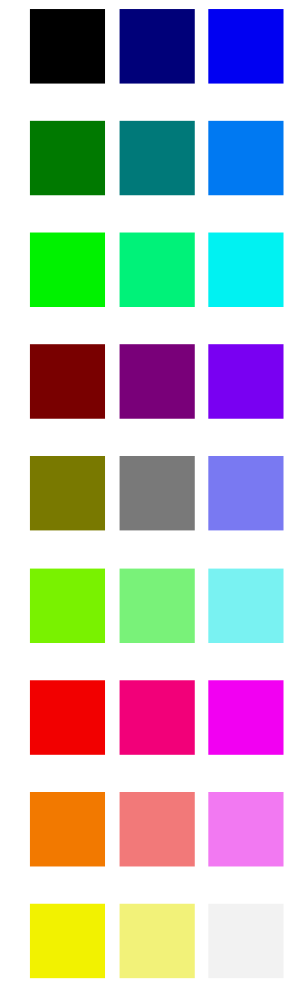

In [82]:
fig, axes = plt.subplots(nrows=9, ncols=3, figsize=(5,20))
for r in range(9):
    for c in range(3):
        ix = r*3+c
        axes[r,c].imshow(np.ones(shape=(200,200,3))*color_set_total[ix])
        axes[r,c].axis('off')
plt.show()

In [84]:
NB_COLORS = 10
data_folder = '../data/temp-color/'

In [85]:
ix = np.random.choice(range(len(COLOR_SET)), NB_COLORS, replace=False)
color_set = COLOR_SET[ix]
shape_set = [generate_random_shape(0, 500, 0, 500, 100) for _ in range(NB_SHAPES)]

In [15]:
def generate_image1(shape, color, save_file):
    # Generate the base image and save it to a file
    img = np.ones(shape=(500, 500, 3))
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img*color, interpolation='bicubic')
    plt.savefig(save_file)
    plt.close()
    # Load the base image from file, crop it using mplpath,
    # and save back to the file
    img = image.load_img(save_file, target_size=(500, 500))
    img = image.img_to_array(img)
    img /= 255.
    p = mplpath.Path(shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if not p.contains_point((i, j)):
                img[j,i,:] = np.array([1.,1.,1.])
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img)
    plt.savefig(save_file, bbox_inches='tight')
    plt.close()

In [64]:
for j, shape in enumerate(shape_set):
    for i, color in enumerate(color_set):
        save_file = os.path.join(
            data_folder,
            'shape%0.2i_color%0.2i.png' % (j, i)
        )
        generate_image1(shape, color, save_file)

In [5]:
def load_images(data_folder, target_size=(200, 200), shift=False):
    # First load the images
    files = [file for file in os.listdir(data_folder) if file.endswith('png')]
    files = sorted(files)
    imgs = np.zeros(shape=(len(files),)+target_size+(3,), dtype=np.float32)
    for i, file in enumerate(files):
        img_path = os.path.join(data_folder, file)
        img = image.load_img(img_path, target_size=target_size,
                             interpolation='bicubic')
        img = image.img_to_array(img) / 255.
        if shift:
            img = shift_image(img, img_size=target_size)
        imgs[i] = img

    return imgs

In [6]:
def similarity(x1, x2, measure='cosine'):
    """
    Computes the cosine similarity between two vectors.
    :param x1: (Numpy array) The first vector.
    :param x2: (Numpy array) The second vector.
    :return: (int) The similarity score.
    """
    assert measure in ['cosine', 'euclidean']
    if measure == 'cosine':
        return 1 - cosine(x1, x2)
    else:
        return -np.linalg.norm(x1 - x2)

In [8]:
imgs = load_images(data_folder)
imgs_rgb = imgs.reshape((len(imgs), -1))
print(imgs.shape)
print(imgs_rgb.shape)

(100, 200, 200, 3)
(100, 120000)


In [11]:
files = [file for file in os.listdir(data_folder) if file.endswith('png')]
files = sorted(files)
shapes = np.zeros(len(imgs))
colors = np.zeros(len(imgs))
for i, filename in enumerate(files):
    shape, color = filename.split('_')
    color = color.split('.')[0]
    shapes[i] = int(shape[-2:])
    colors[i] = int(color[-2:])

In [45]:
# similarities = np.zeros(10)
# for k in range(10):
#     i, j = np.random.choice(range(NB_COLORS), 2, replace=False)
#     ix1 = i+NB_COLORS*2
#     ix2 = j+NB_COLORS*2
#     fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,3))
#     axes[0].imshow(imgs[ix1])
#     axes[0].axis('off')
#     axes[1].imshow(imgs[ix2])
#     axes[1].axis('off')
#     similarities[k] = similarity(imgs_rgb[ix1], imgs_rgb[ix2])
#     print('Similarity: %0.3f' % similarities[k])
#     plt.show()
#     print('\n\n')
# print('Average similarity: %0.3f' % np.mean(similarities))

In [46]:
# similarities = np.zeros(10)
# for k in range(10):
#     i, j = np.random.choice(range(NB_SHAPES), 2, replace=False)
#     ix1 = NB_COLORS*i+6
#     ix2 = NB_COLORS*j+6
#     fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,3))
#     axes[0].imshow(imgs[ix1])
#     axes[0].axis('off')
#     axes[1].imshow(imgs[ix2])
#     axes[1].axis('off')
#     similarities[k] = similarity(imgs_rgb[ix1], imgs_rgb[ix2])
#     print('Similarity: %0.3f' % similarities[k])
#     plt.show()
#     print('\n\n')
# print('Average similarity: %0.3f' % np.mean(similarities))

In [86]:
def make_trial(shape, other):
    # create a random trial
    ix = np.arange(len(shape))
    while True:
        baseline = np.random.choice(ix)
        s = shape[baseline]
        o = other[baseline]
        # only matches in shape
        shape_matches = np.where((shape == s) & (other != o))[0]
        # only matches in 'other' feature
        other_matches = np.where((shape != s) & (other == o))[0]

        if len(shape_matches) > 0 and len(other_matches) > 0:
            break  # make sure we have an option for each image...

    shape_match = np.random.choice(shape_matches)
    other_match = np.random.choice(other_matches)

    return [baseline, shape_match, other_match]

In [38]:
NB_TRIALS = 1000
trials = []
for i in range(NB_TRIALS):
    trials.append(make_trial(shapes, colors))

In [67]:
def evaluate_secondOrder(X_p, trials, metric='cosine'):
    nb_trials = len(trials)
    selections = {0:0, 1:0}
    for trial in trials:
        score_shape = similarity(X_p[trial[0]], X_p[trial[1]], metric)
        score_color = similarity(X_p[trial[0]], X_p[trial[2]], metric)
        match = np.argmax([score_shape, score_color])
        selections[match] += 1

    # Return the percentage of times we were correct
    return selections[0]/nb_trials, selections[1]/nb_trials

In [43]:
shape_score, color_score = evaluate_secondOrder(imgs_rgb, trials)
print('shape score: %0.3f' % shape_score)
print('color score: %0.3f' % color_score)

shape score: 0.245
color score: 0.755


In [44]:
shape_score, color_score = evaluate_secondOrder(imgs_rgb, trials, 'euclidean')
print('shape score: %0.3f' % shape_score)
print('color score: %0.3f' % color_score)

shape score: 0.224
color score: 0.776


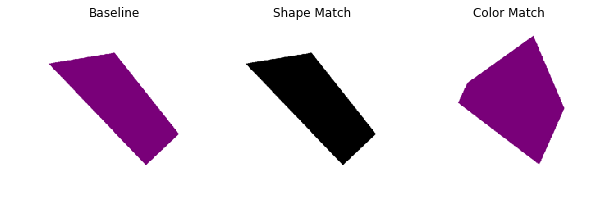

shape match similarity: 0.978
color match similarity: 0.956




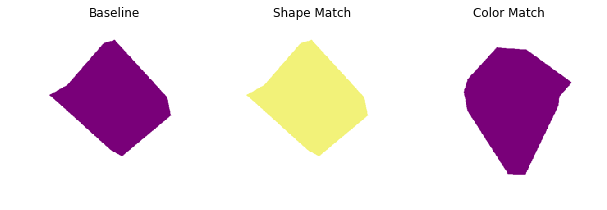

shape match similarity: 0.942
color match similarity: 0.970




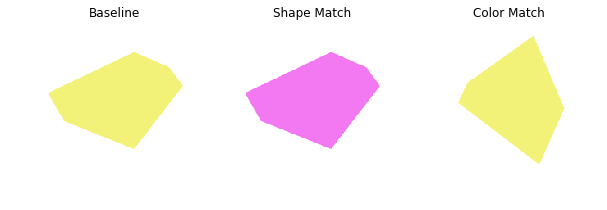

shape match similarity: 0.977
color match similarity: 0.995




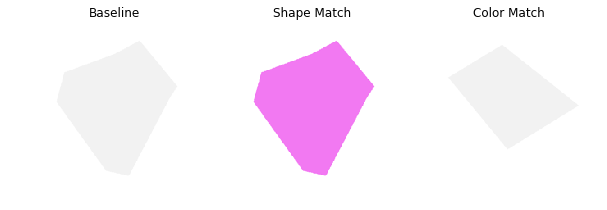

shape match similarity: 0.987
color match similarity: 1.000




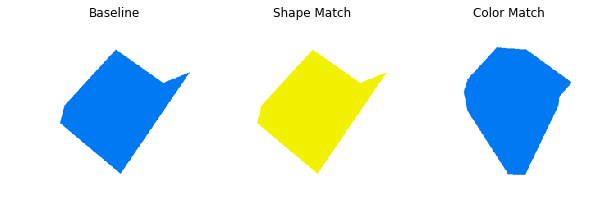

shape match similarity: 0.886
color match similarity: 0.978




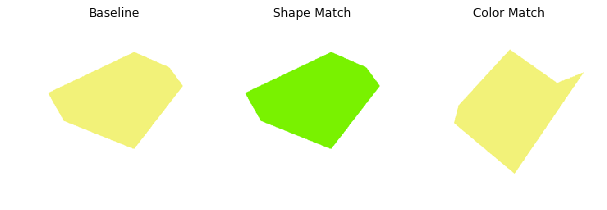

shape match similarity: 0.977
color match similarity: 0.995




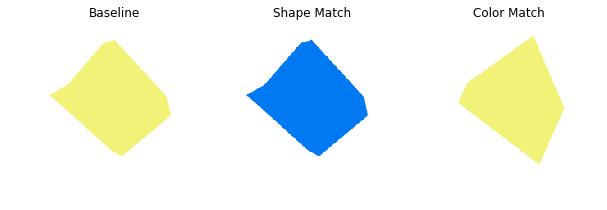

shape match similarity: 0.929
color match similarity: 0.995




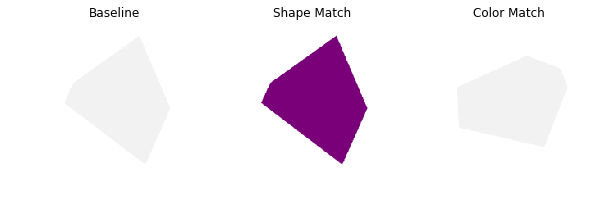

shape match similarity: 0.937
color match similarity: 1.000




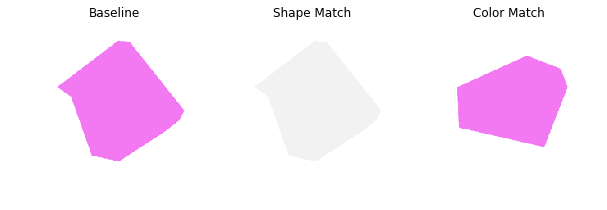

shape match similarity: 0.988
color match similarity: 0.994




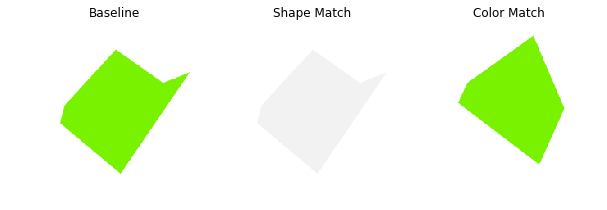

shape match similarity: 0.943
color match similarity: 0.967




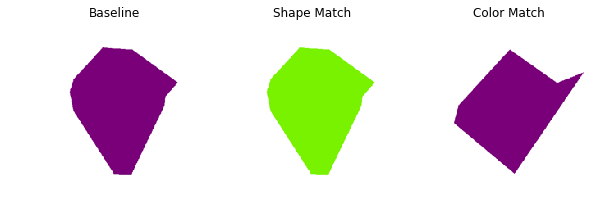

shape match similarity: 0.925
color match similarity: 0.970




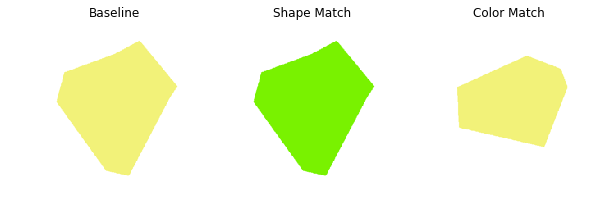

shape match similarity: 0.970
color match similarity: 0.994




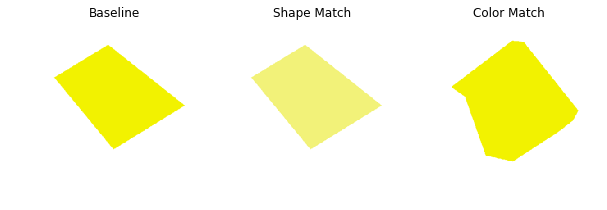

shape match similarity: 0.990
color match similarity: 0.981




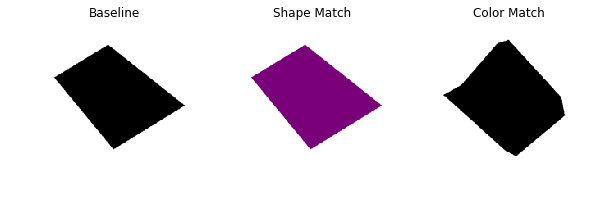

shape match similarity: 0.976
color match similarity: 0.954




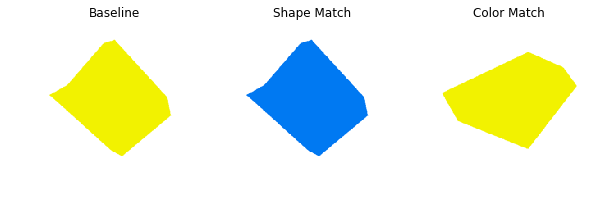

shape match similarity: 0.892
color match similarity: 0.982




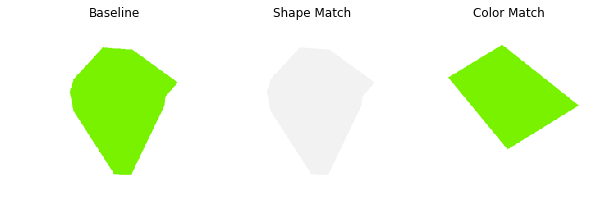

shape match similarity: 0.938
color match similarity: 0.970




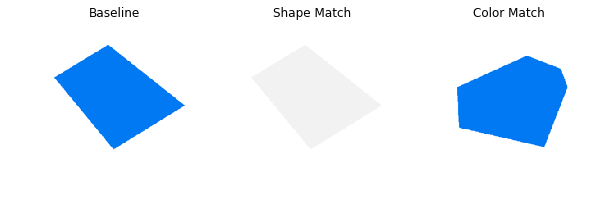

shape match similarity: 0.951
color match similarity: 0.971




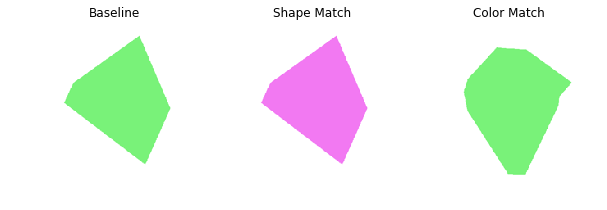

shape match similarity: 0.966
color match similarity: 0.989




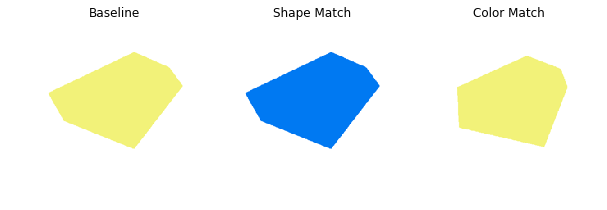

shape match similarity: 0.929
color match similarity: 0.998




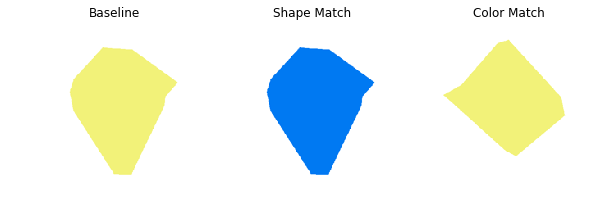

shape match similarity: 0.919
color match similarity: 0.995




In [41]:
for trial in trials[:20]:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,3))
    axes[0].imshow(imgs[trial[0]])
    axes[0].axis('off')
    axes[0].set_title('Baseline')
    axes[1].imshow(imgs[trial[1]])
    axes[1].axis('off')
    axes[1].set_title('Shape Match')
    axes[2].imshow(imgs[trial[2]])
    axes[2].axis('off')
    axes[2].set_title('Color Match')
    plt.show()
    print('shape match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[1]]))
    print('color match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[2]]))
    print('\n')

# Next, try with texture

In [7]:
NB_TEXTURES = 10
data_folder = '../data/temp-texture/'

In [8]:
def generate_textures(nb_textures):
    assert os.path.isdir('../data/textures')
    files = sorted([file for file in os.listdir('../data/textures') if file.endswith('tiff')])
    
    return np.random.choice(files, nb_textures, replace=False)

In [9]:
texture_set = generate_textures(NB_TEXTURES)

In [79]:
def generate_image2(shape, texture, save_file):
    # Generate the base image and save it to a file
    img = image.load_img('../data/textures/%s' % texture, 
                         target_size=(500, 500))
    img = image.img_to_array(img) / 255.
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, interpolation='bicubic')
    plt.savefig(save_file)
    plt.close()
    # Load the base image from file, crop it using mplpath,
    # and save back to the file
    img = image.load_img(save_file, target_size=(500, 500))
    img = image.img_to_array(img)
    img /= 255.
    p = mplpath.Path(shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if not p.contains_point((i, j)):
                img[j,i,:] = np.array([1.,1.,1.])
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img)
    plt.savefig(save_file, bbox_inches='tight')
    plt.close()

In [80]:
for j, shape in enumerate(shape_set):
    for i, texture in enumerate(texture_set):
        save_file = os.path.join(
            data_folder,
            'shape%0.2i_texture%0.2i.png' % (j, i)
        )
        generate_image2(shape, texture, save_file)

In [81]:
imgs = load_images(data_folder)
imgs_rgb = imgs.reshape((len(imgs), -1))
print(imgs.shape)
print(imgs_rgb.shape)

(100, 200, 200, 3)
(100, 120000)


In [82]:
files = [file for file in os.listdir(data_folder) if file.endswith('png')]
files = sorted(files)
shapes = np.zeros(len(imgs))
textures = np.zeros(len(imgs))
for i, filename in enumerate(files):
    shape, texture = filename.split('_')
    texture = texture.split('.')[0]
    shapes[i] = int(shape[-2:])
    textures[i] = int(texture[-2:])

In [83]:
NB_TRIALS = 1000
trials = []
for i in range(NB_TRIALS):
    trials.append(make_trial(shapes, textures))

In [84]:
shape_score, texture_score = evaluate_secondOrder(imgs_rgb, trials)
print('shape score: %0.3f' % shape_score)
print('texture score: %0.3f' % texture_score)

shape score: 0.811
texture score: 0.189


In [85]:
shape_score, texture_score = evaluate_secondOrder(imgs_rgb, trials, 'euclidean')
print('shape score: %0.3f' % shape_score)
print('texture score: %0.3f' % texture_score)

shape score: 0.816
texture score: 0.184


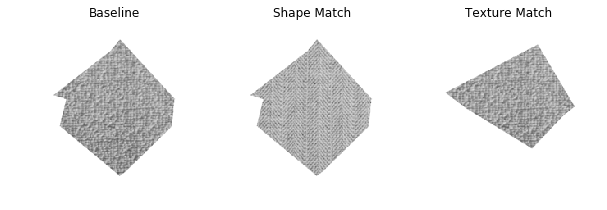

shape match similarity: 0.997
texture match similarity: 0.987




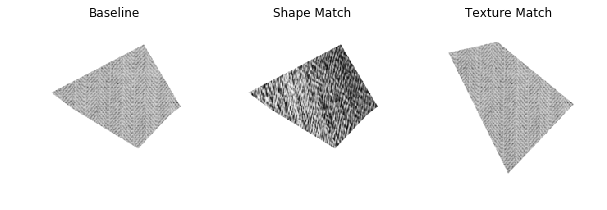

shape match similarity: 0.988
texture match similarity: 0.991




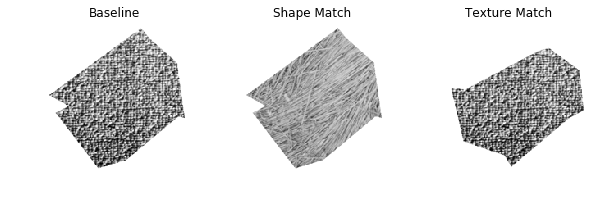

shape match similarity: 0.982
texture match similarity: 0.984




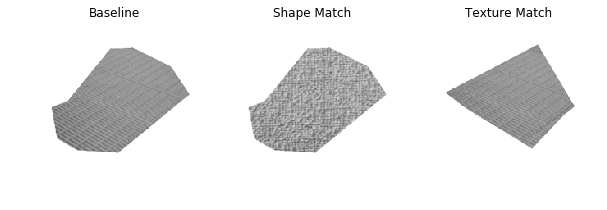

shape match similarity: 0.998
texture match similarity: 0.983




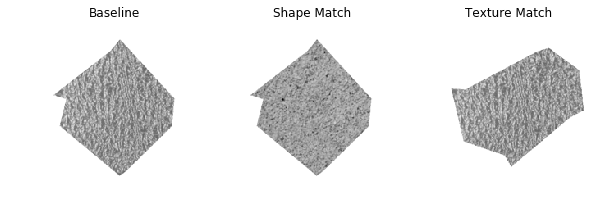

shape match similarity: 0.997
texture match similarity: 0.986




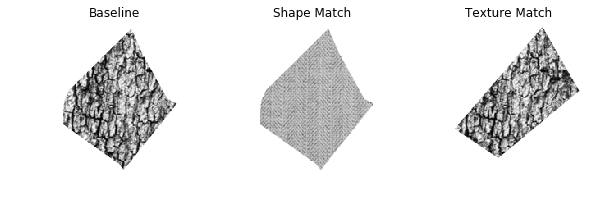

shape match similarity: 0.983
texture match similarity: 0.969




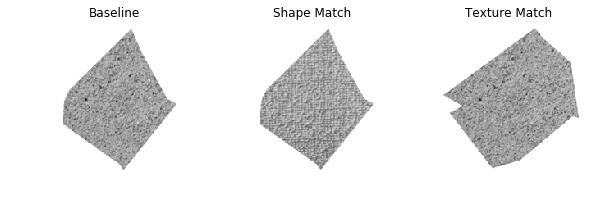

shape match similarity: 0.998
texture match similarity: 0.990




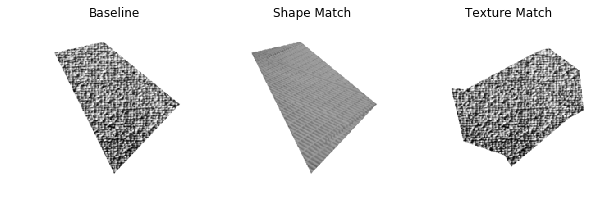

shape match similarity: 0.991
texture match similarity: 0.967




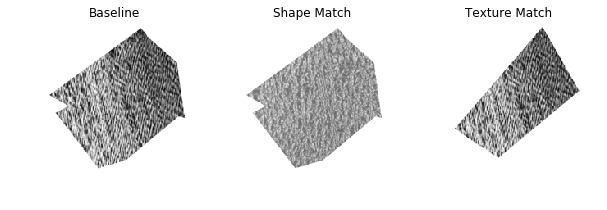

shape match similarity: 0.984
texture match similarity: 0.976




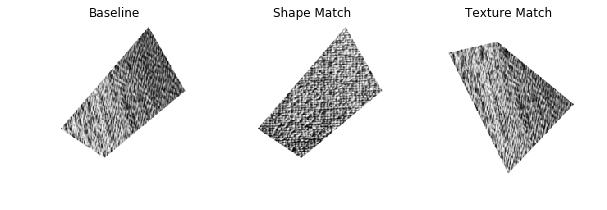

shape match similarity: 0.984
texture match similarity: 0.960




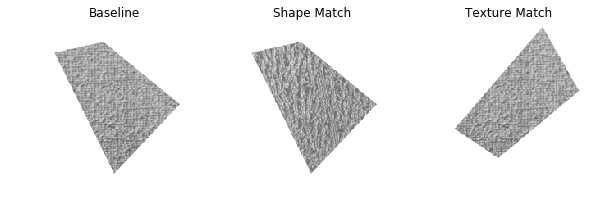

shape match similarity: 0.997
texture match similarity: 0.981




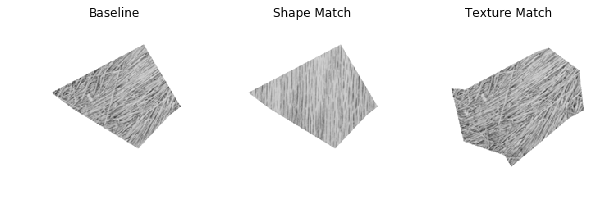

shape match similarity: 0.998
texture match similarity: 0.987




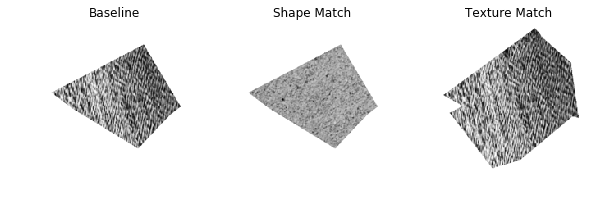

shape match similarity: 0.991
texture match similarity: 0.975




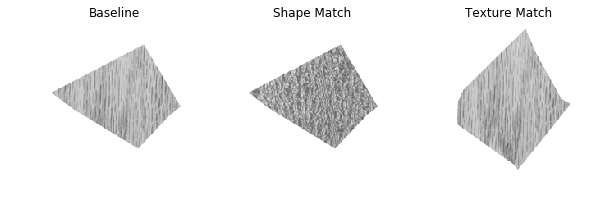

shape match similarity: 0.997
texture match similarity: 0.993




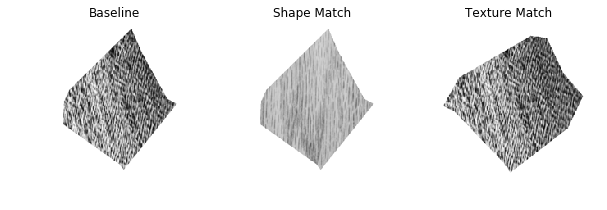

shape match similarity: 0.985
texture match similarity: 0.977




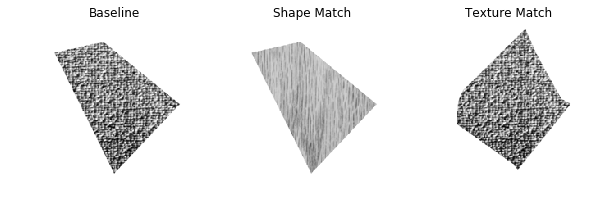

shape match similarity: 0.986
texture match similarity: 0.979




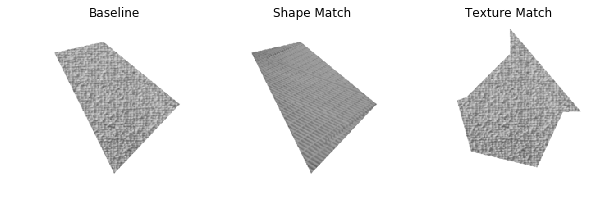

shape match similarity: 0.998
texture match similarity: 0.986




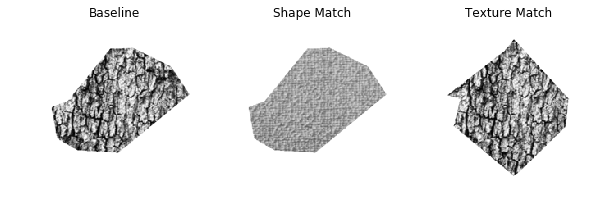

shape match similarity: 0.984
texture match similarity: 0.972




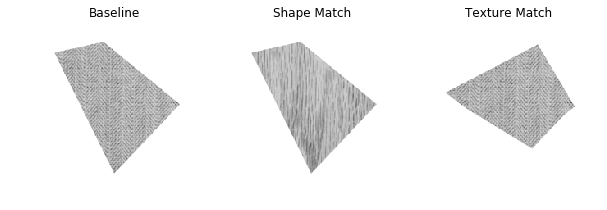

shape match similarity: 0.998
texture match similarity: 0.991




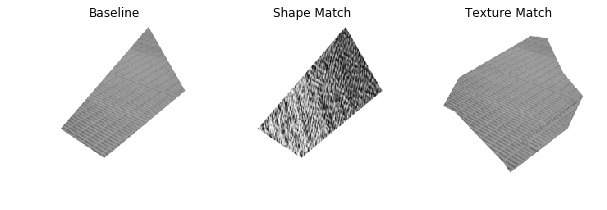

shape match similarity: 0.992
texture match similarity: 0.980




In [86]:
for trial in trials[:20]:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,3))
    axes[0].imshow(imgs[trial[0]])
    axes[0].axis('off')
    axes[0].set_title('Baseline')
    axes[1].imshow(imgs[trial[1]])
    axes[1].axis('off')
    axes[1].set_title('Shape Match')
    axes[2].imshow(imgs[trial[2]])
    axes[2].axis('off')
    axes[2].set_title('Texture Match')
    plt.show()
    print('shape match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[1]]))
    print('texture match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[2]]))
    print('\n')

# Now retry color experiment w/ random textures applied

In [87]:
from learning2learn.images import generate_image

In [88]:
NB_COLORS = 10
NB_SHAPES = 10
data_folder = '../data/temp-color2/'

In [89]:
ix = np.random.choice(range(len(COLOR_SET)), NB_COLORS, replace=False)
color_set = COLOR_SET[ix]
shape_set = [generate_random_shape(0, 500, 0, 500, 100) for _ in range(NB_SHAPES)]

In [91]:
for j, shape in enumerate(shape_set):
    for i, color in enumerate(color_set):
        save_file = os.path.join(
            data_folder,
            'shape%0.2i_color%0.2i.png' % (j, i)
        )
        textures = sorted([file for file in os.listdir('../data/textures') if file.endswith('tiff')])
        texture = np.random.choice(textures, 1)[0]
        generate_image(shape, color, texture, save_file)

In [92]:
imgs = load_images(data_folder)
imgs_rgb = imgs.reshape((len(imgs), -1))
print(imgs.shape)
print(imgs_rgb.shape)

(100, 200, 200, 3)
(100, 120000)


In [93]:
files = [file for file in os.listdir(data_folder) if file.endswith('png')]
files = sorted(files)
shapes = np.zeros(len(imgs))
colors = np.zeros(len(imgs))
for i, filename in enumerate(files):
    shape, color = filename.split('_')
    color = color.split('.')[0]
    shapes[i] = int(shape[-2:])
    colors[i] = int(color[-2:])

In [95]:
NB_TRIALS = 1000
trials = []
for i in range(NB_TRIALS):
    trials.append(make_trial(shapes, colors))

In [96]:
shape_score, color_score = evaluate_secondOrder(imgs_rgb, trials)
print('shape score: %0.3f' % shape_score)
print('color score: %0.3f' % color_score)

shape score: 0.914
color score: 0.086


In [97]:
shape_score, color_score = evaluate_secondOrder(imgs_rgb, trials, 'euclidean')
print('shape score: %0.3f' % shape_score)
print('color score: %0.3f' % color_score)

shape score: 0.920
color score: 0.080


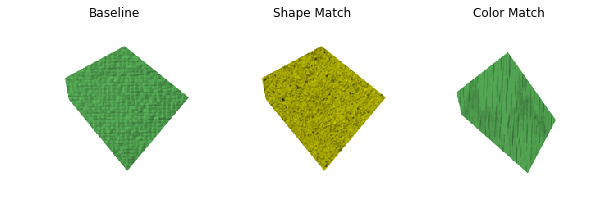

shape match similarity: 0.987
color match similarity: 0.973




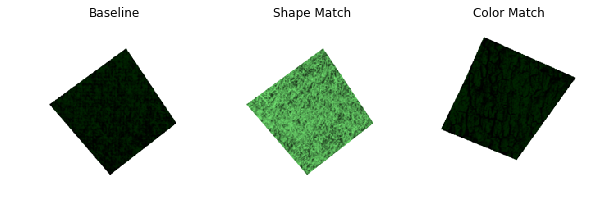

shape match similarity: 0.967
color match similarity: 0.904




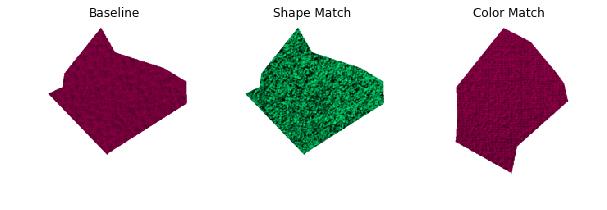

shape match similarity: 0.964
color match similarity: 0.942




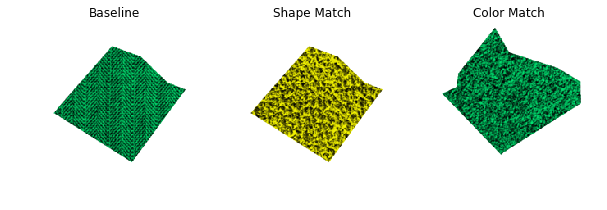

shape match similarity: 0.968
color match similarity: 0.947




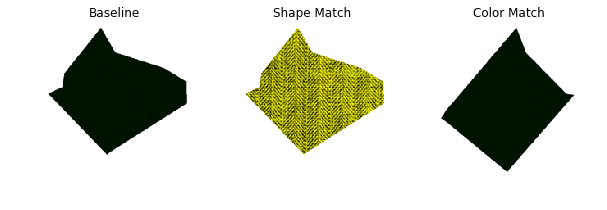

shape match similarity: 0.948
color match similarity: 0.898




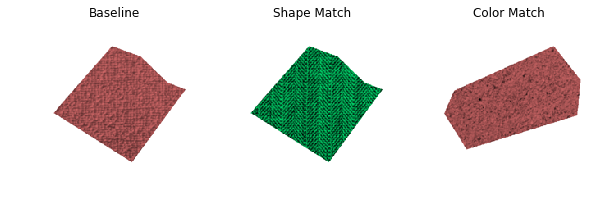

shape match similarity: 0.971
color match similarity: 0.966




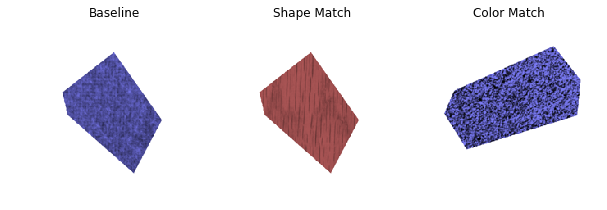

shape match similarity: 0.991
color match similarity: 0.946




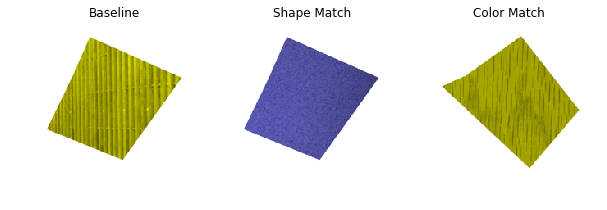

shape match similarity: 0.955
color match similarity: 0.952




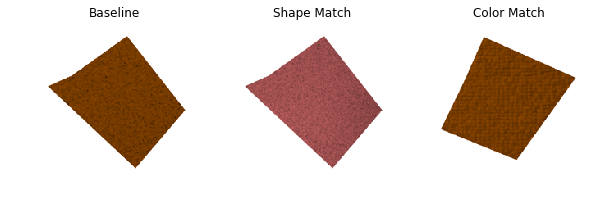

shape match similarity: 0.991
color match similarity: 0.928




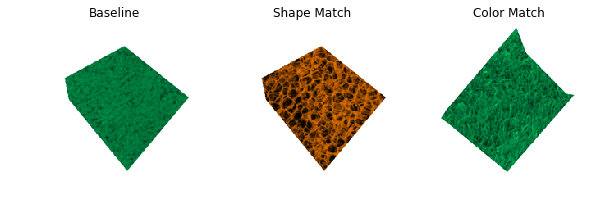

shape match similarity: 0.974
color match similarity: 0.942




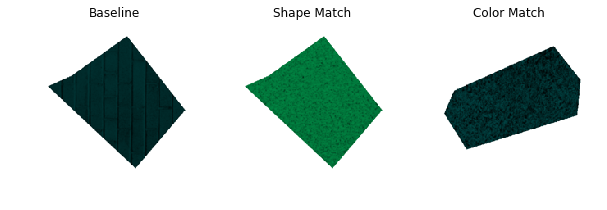

shape match similarity: 0.992
color match similarity: 0.888




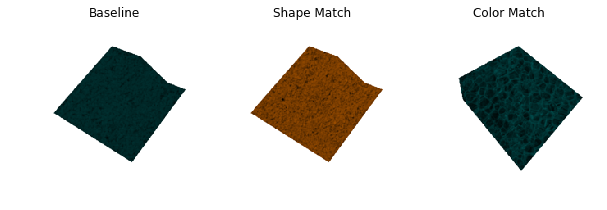

shape match similarity: 0.984
color match similarity: 0.965




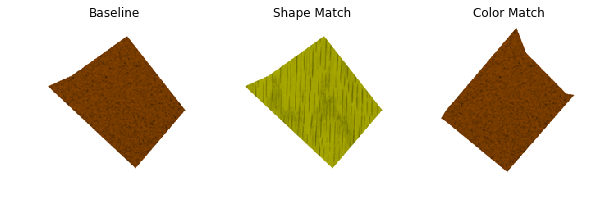

shape match similarity: 0.988
color match similarity: 0.938




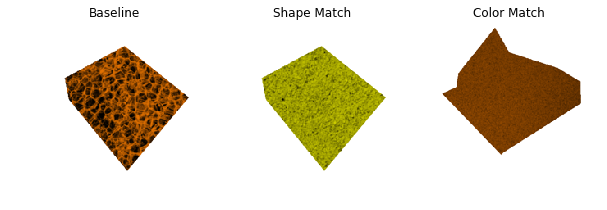

shape match similarity: 0.985
color match similarity: 0.945




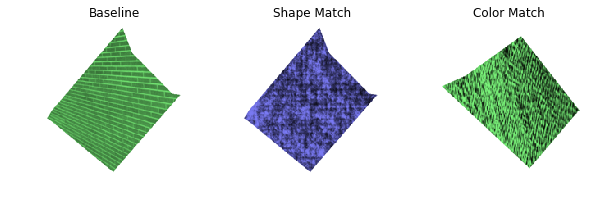

shape match similarity: 0.982
color match similarity: 0.957




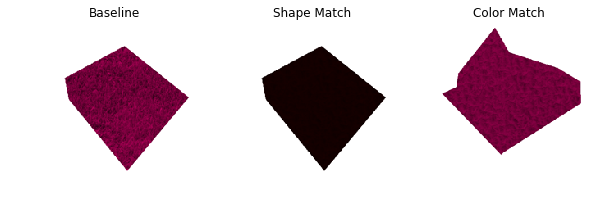

shape match similarity: 0.987
color match similarity: 0.948




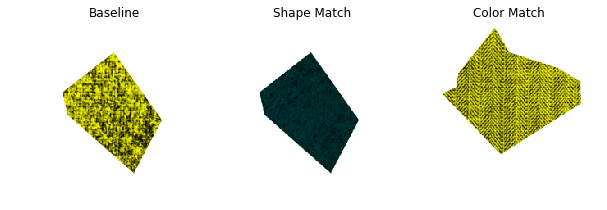

shape match similarity: 0.970
color match similarity: 0.942




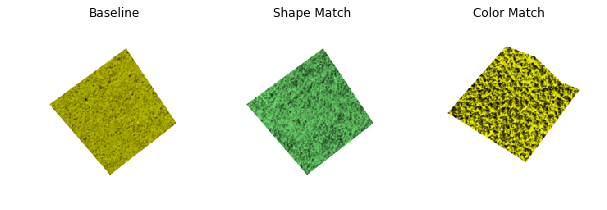

shape match similarity: 0.986
color match similarity: 0.965




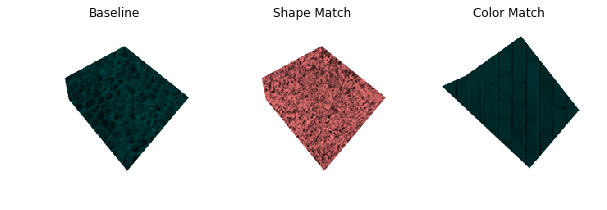

shape match similarity: 0.969
color match similarity: 0.968




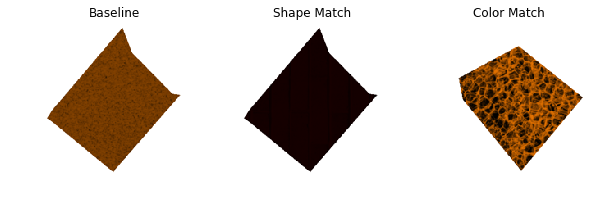

shape match similarity: 0.985
color match similarity: 0.940




In [98]:
for trial in trials[:20]:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,3))
    axes[0].imshow(imgs[trial[0]])
    axes[0].axis('off')
    axes[0].set_title('Baseline')
    axes[1].imshow(imgs[trial[1]])
    axes[1].axis('off')
    axes[1].set_title('Shape Match')
    axes[2].imshow(imgs[trial[2]])
    axes[2].axis('off')
    axes[2].set_title('Color Match')
    plt.show()
    print('shape match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[1]]))
    print('color match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[2]]))
    print('\n')

# Test some things here...

In [99]:
img_texture = image.load_img('../data/textures/%s' % texture_set[0],
                             target_size=(300, 300))
img_texture = image.img_to_array(img_texture) / 255.

In [100]:
color = np.array([0.7, 0.3, 0.5])
img_color = np.ones(shape=(300, 300, 3))*color

In [101]:
img_combined = img_texture*color

In [102]:
img_combined1 = img_combined * (color.mean()/img_combined.mean())
img_combined1 = np.minimum(img_combined1, 1.)

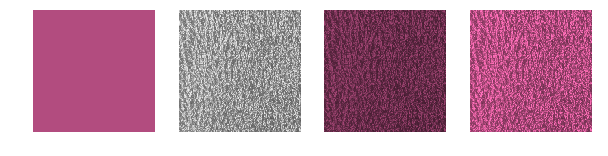

In [103]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10,3))
axes[0].imshow(img_color)
axes[0].axis('off')
axes[1].imshow(img_texture)
axes[1].axis('off')
axes[2].imshow(img_combined)
axes[2].axis('off')
axes[3].imshow(img_combined1)
axes[3].axis('off')
plt.show()

In [33]:
img_color.reshape((-1,3)).mean(axis=0)

array([ 0.7,  0.3,  0.5])

In [39]:
img_combined.reshape((-1,3)).mean(axis=0)

array([ 0.42266678,  0.18114291,  0.30190484])

In [59]:
img_combined1.reshape((-1,3)).mean(axis=0)

array([ 0.69823515,  0.3       ,  0.5       ])

# Now retry random textures thing but with images adjusted for color consistency

In [104]:
def generate_image3(shape, color, texture, save_file):
    """

    :param shape:
    :param color:
    :param texture:
    :param save_file:
    :return:
    """
    # Generate the base image and save it to a file
    img = image.load_img('../data/textures/%s' % texture, target_size=(500, 500))
    img = image.img_to_array(img) / 255.
    # normalize the texturized image for color consistency.
    img *= (color.mean()/img.mean())
    img = np.minimum(img, 1.)
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img*color, interpolation='bicubic')
    plt.savefig(save_file)
    plt.close()
    # Load the base image from file, crop it using mplpath,
    # and save back to the file
    img = image.load_img(save_file, target_size=(500, 500))
    img = image.img_to_array(img)
    img /= 255.
    p = mplpath.Path(shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if not p.contains_point((i, j)):
                img[j,i,:] = np.array([1.,1.,1.])
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img)
    plt.savefig(save_file, bbox_inches='tight')
    plt.close()

In [105]:
data_folder = '../data/temp-color3/'

In [106]:
for j, shape in enumerate(shape_set):
    for i, color in enumerate(color_set):
        save_file = os.path.join(
            data_folder,
            'shape%0.2i_color%0.2i.png' % (j, i)
        )
        textures = sorted([file for file in os.listdir('../data/textures') if file.endswith('tiff')])
        texture = np.random.choice(textures, 1)[0]
        generate_image3(shape, color, texture, save_file)

In [107]:
imgs = load_images(data_folder)
imgs_rgb = imgs.reshape((len(imgs), -1))
print(imgs.shape)
print(imgs_rgb.shape)

(100, 200, 200, 3)
(100, 120000)


In [108]:
files = [file for file in os.listdir(data_folder) if file.endswith('png')]
files = sorted(files)
shapes = np.zeros(len(imgs))
colors = np.zeros(len(imgs))
for i, filename in enumerate(files):
    shape, color = filename.split('_')
    color = color.split('.')[0]
    shapes[i] = int(shape[-2:])
    colors[i] = int(color[-2:])

In [109]:
NB_TRIALS = 1000
trials = []
for i in range(NB_TRIALS):
    trials.append(make_trial(shapes, colors))

In [110]:
shape_score, color_score = evaluate_secondOrder(imgs_rgb, trials)
print('shape score: %0.3f' % shape_score)
print('color score: %0.3f' % color_score)

shape score: 0.900
color score: 0.100


In [111]:
shape_score, color_score = evaluate_secondOrder(imgs_rgb, trials, 'euclidean')
print('shape score: %0.3f' % shape_score)
print('color score: %0.3f' % color_score)

shape score: 0.910
color score: 0.090


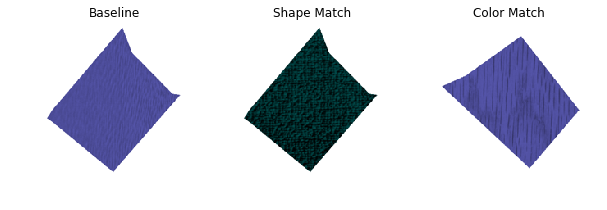

shape match similarity: 0.975
color match similarity: 0.964




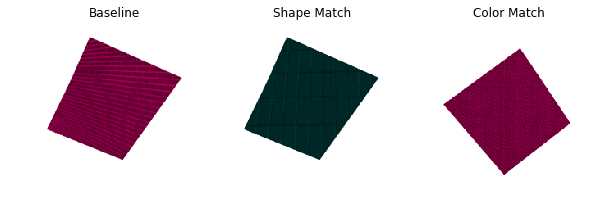

shape match similarity: 0.980
color match similarity: 0.938




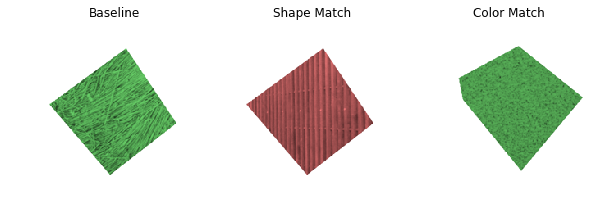

shape match similarity: 0.986
color match similarity: 0.967




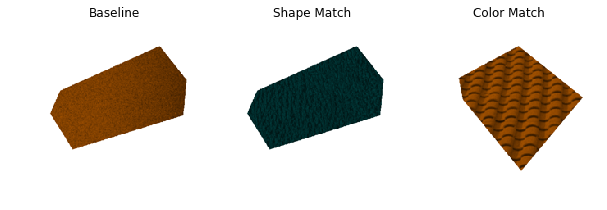

shape match similarity: 0.982
color match similarity: 0.925




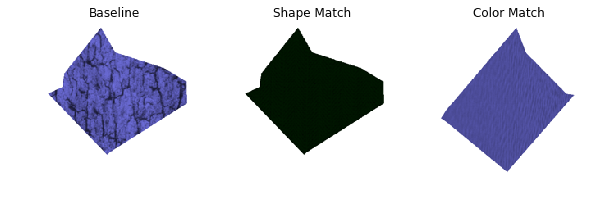

shape match similarity: 0.957
color match similarity: 0.960




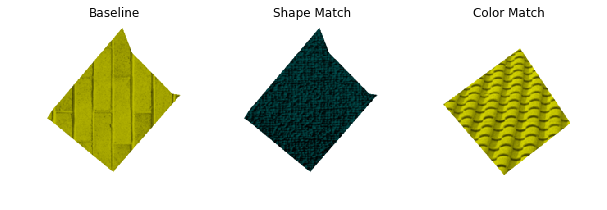

shape match similarity: 0.952
color match similarity: 0.972




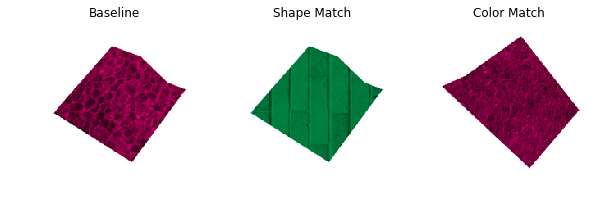

shape match similarity: 0.970
color match similarity: 0.959




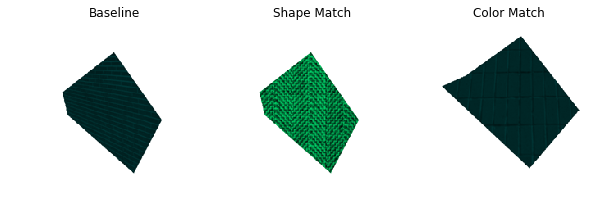

shape match similarity: 0.994
color match similarity: 0.928




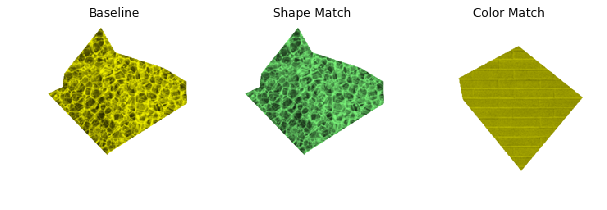

shape match similarity: 0.985
color match similarity: 0.961




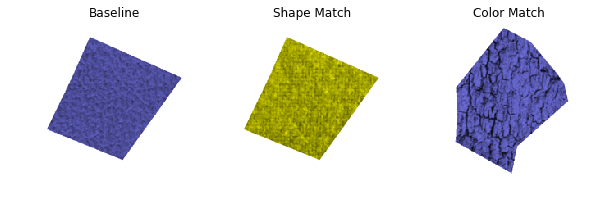

shape match similarity: 0.957
color match similarity: 0.973




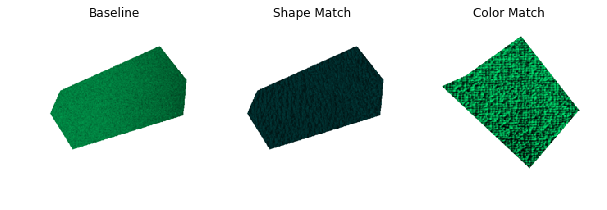

shape match similarity: 0.992
color match similarity: 0.912




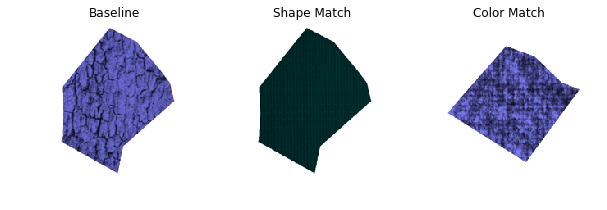

shape match similarity: 0.969
color match similarity: 0.958




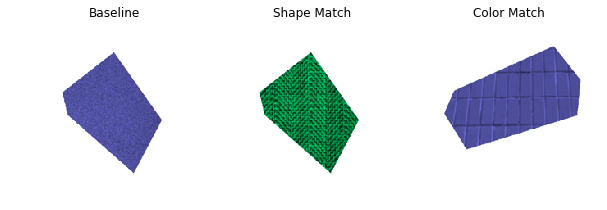

shape match similarity: 0.985
color match similarity: 0.952




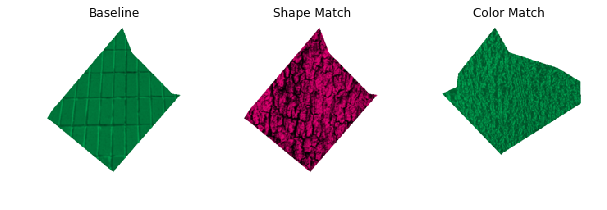

shape match similarity: 0.962
color match similarity: 0.934




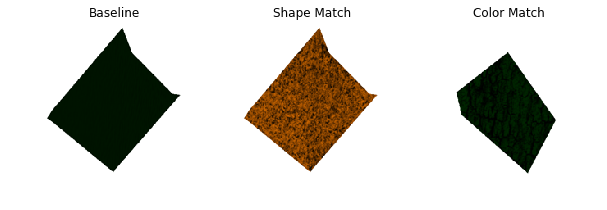

shape match similarity: 0.979
color match similarity: 0.909




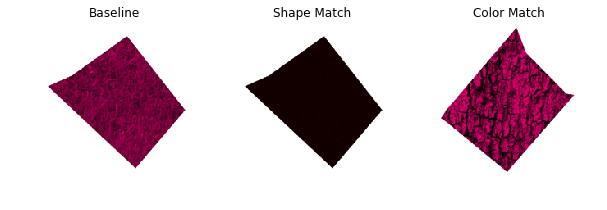

shape match similarity: 0.985
color match similarity: 0.933




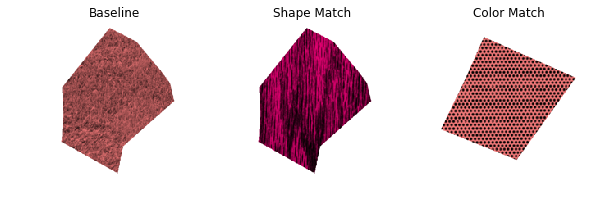

shape match similarity: 0.985
color match similarity: 0.965




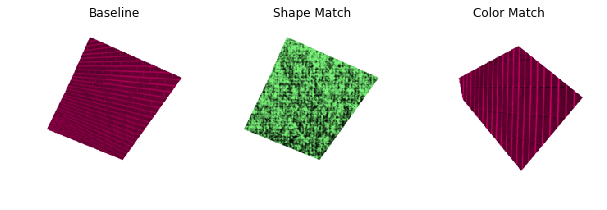

shape match similarity: 0.964
color match similarity: 0.936




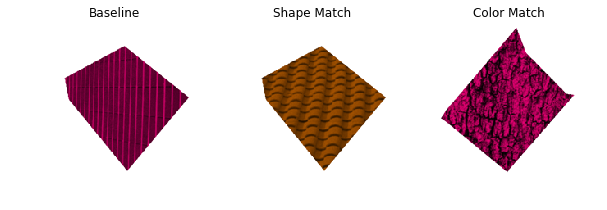

shape match similarity: 0.991
color match similarity: 0.938




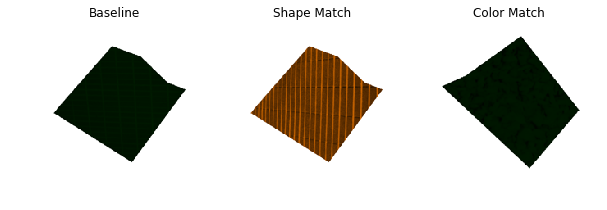

shape match similarity: 0.984
color match similarity: 0.940




In [112]:
for trial in trials[:20]:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,3))
    axes[0].imshow(imgs[trial[0]])
    axes[0].axis('off')
    axes[0].set_title('Baseline')
    axes[1].imshow(imgs[trial[1]])
    axes[1].axis('off')
    axes[1].set_title('Shape Match')
    axes[2].imshow(imgs[trial[2]])
    axes[2].axis('off')
    axes[2].set_title('Color Match')
    plt.show()
    print('shape match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[1]]))
    print('color match similarity: %0.3f' % similarity(imgs_rgb[trial[0]], imgs_rgb[trial[2]]))
    print('\n')

# Let's rigorously analyze what's going on.

In [117]:
def generate_image_np(shape, color, texture=None):
    """

    :param shape:
    :param color:
    :param texture:
    :return:
    """
    save_file = '../data/temp.png'
    if texture is None:
        img = np.ones(shape=(500, 500, 3))
    else:
        # Generate the base image and save it to a file
        img = image.load_img('../data/textures/%s' % texture, target_size=(500, 500))
        img = image.img_to_array(img) / 255.
        # normalize the texturized image for color consistency.
        img *= (color.mean()/img.mean())
        img = np.minimum(img, 1.)
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img*color, interpolation='bicubic')
    plt.savefig(save_file)
    plt.close()
    # Load the base image from file, crop it using mplpath,
    # and save back to the file
    img = image.load_img(save_file, target_size=(500, 500))
    os.remove(save_file)
    img = image.img_to_array(img)
    img /= 255.
    p = mplpath.Path(shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if not p.contains_point((i, j)):
                img[j,i,:] = np.array([1.,1.,1.])
                
    return img

In [118]:
imgs = np.asarray(
    [generate_image_np(shape, COLOR_SET[10]) for shape in shape_set]
)

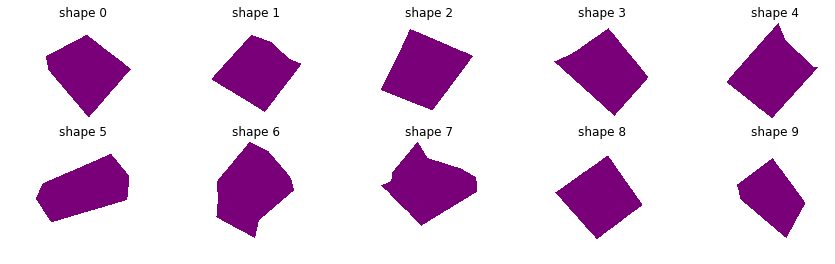

In [124]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15,4))
for i in range(2):
    for j in range(5):
        ix = i*5 + j
        axes[i,j].imshow(imgs[ix])
        axes[i,j].axis('off')
        axes[i,j].set_title('shape %i' % ix)
plt.show()

In [139]:
color_set = sorted(COLOR_SET, key=lambda x: np.linalg.norm(x))

In [141]:
imgs = np.asarray(
    [generate_image_np(shape_set[1], color) for color in color_set]
)

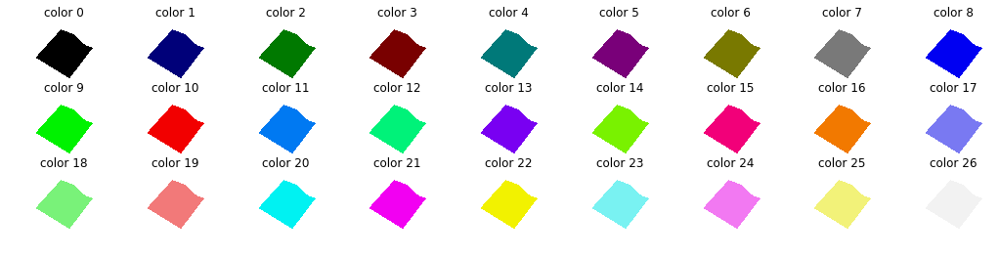

In [142]:
fig, axes = plt.subplots(nrows=3, ncols=9, figsize=(18,4))
for i in range(3):
    for j in range(9):
        ix = i*9 + j
        axes[i,j].imshow(imgs[ix])
        axes[i,j].axis('off')
        axes[i,j].set_title('color %i' % ix)
plt.show()

In [181]:
def compare2(img1, img2, metric='cosine'):
    sim = similarity(img1.flatten(), img2.flatten(), metric)
    print('Similarity: %0.3f' % sim)
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(6,2))
    axes[0].imshow(img1)
    axes[0].axis('off')
    axes[1].imshow(img2)
    axes[1].axis('off')
    plt.show()
    
    return sim

In [179]:
from scipy.spatial.distance import cdist

def modHausdorffDistance(itemA, itemB):
    """
    Modified Hausdorff Distance
    
    Input
     itemA : [n x 2] coordinates of "inked" pixels
     itemB : [m x 2] coordinates of "inked" pixels
    
     M.-P. Dubuisson, A. K. Jain (1994). A modified hausdorff distance for object matching.
     International Conference on Pattern Recognition, pp. 566-568.
    """
    
    D = cdist(itemA, itemB)
    mindist_A = D.min(axis=1)
    mindist_B = D.min(axis=0)
    mean_A = np.mean(mindist_A)
    mean_B = np.mean(mindist_B)
    
    return max(mean_A,mean_B)

In [ ]:
# Does color match score vary with color?

Color:  [ 0.  0.  0.]
Similarity: 0.854


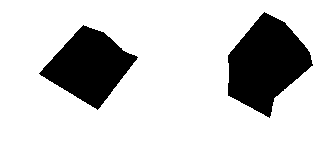




Color:  [ 0.     0.     0.475]
Similarity: 0.895


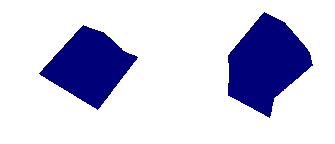




Color:  [ 0.     0.475  0.   ]
Similarity: 0.895


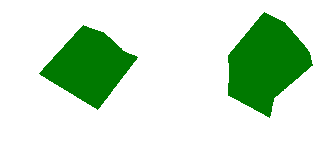




Color:  [ 0.475  0.     0.   ]
Similarity: 0.895


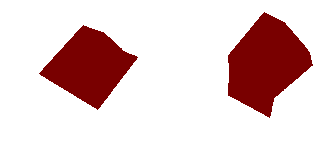




Color:  [ 0.     0.475  0.475]
Similarity: 0.932


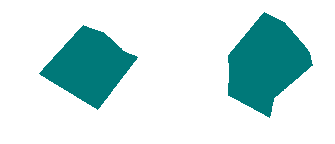




Color:  [ 0.475  0.     0.475]
Similarity: 0.932


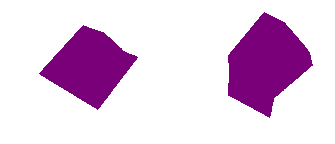




Color:  [ 0.475  0.475  0.   ]
Similarity: 0.932


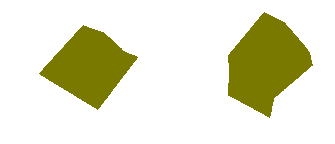




Color:  [ 0.475  0.475  0.475]
Similarity: 0.966


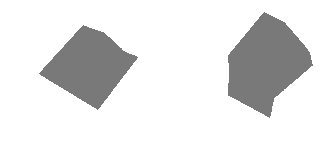




Color:  [ 0.    0.    0.95]
Similarity: 0.919


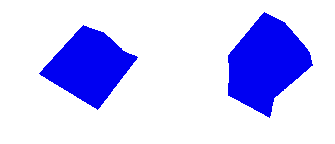




Color:  [ 0.    0.95  0.  ]
Similarity: 0.919


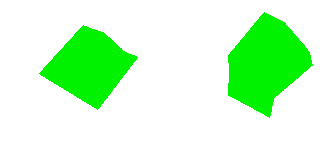




Color:  [ 0.95  0.    0.  ]
Similarity: 0.919


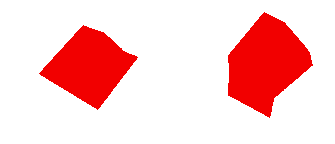




Color:  [ 0.     0.475  0.95 ]
Similarity: 0.951


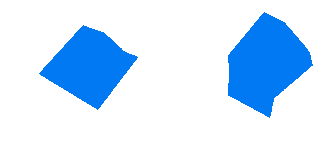




Color:  [ 0.     0.95   0.475]
Similarity: 0.951


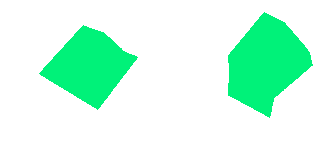




Color:  [ 0.475  0.     0.95 ]
Similarity: 0.951


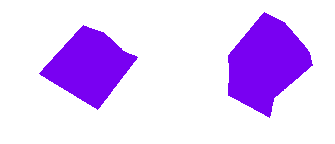




Color:  [ 0.475  0.95   0.   ]
Similarity: 0.951


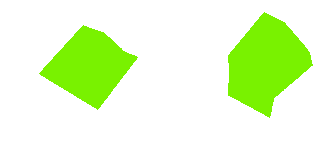




Color:  [ 0.95   0.     0.475]
Similarity: 0.951


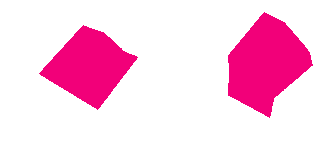




Color:  [ 0.95   0.475  0.   ]
Similarity: 0.951


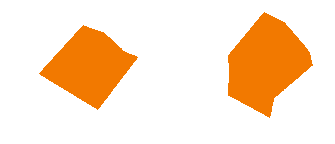




Color:  [ 0.475  0.475  0.95 ]
Similarity: 0.980


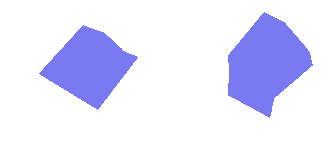




Color:  [ 0.475  0.95   0.475]
Similarity: 0.980


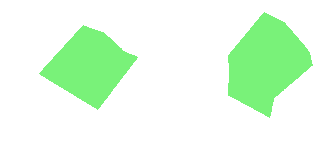




Color:  [ 0.95   0.475  0.475]
Similarity: 0.980


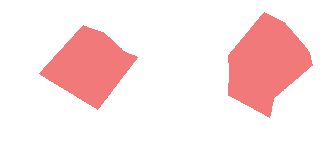




Color:  [ 0.    0.95  0.95]
Similarity: 0.965


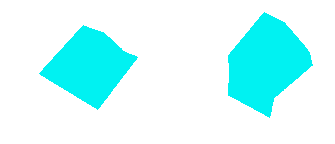




Color:  [ 0.95  0.    0.95]
Similarity: 0.965


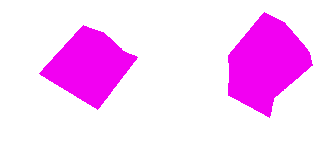




Color:  [ 0.95  0.95  0.  ]
Similarity: 0.965


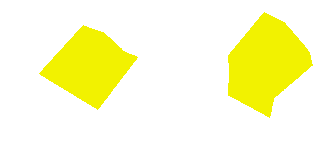




Color:  [ 0.475  0.95   0.95 ]
Similarity: 0.991


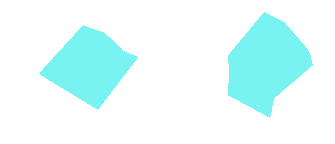




Color:  [ 0.95   0.475  0.95 ]
Similarity: 0.991


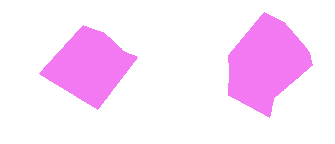




Color:  [ 0.95   0.95   0.475]
Similarity: 0.991


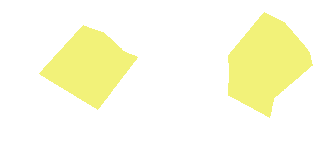




Color:  [ 0.95  0.95  0.95]
Similarity: 1.000


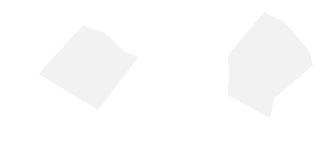

In [208]:
result1 = np.zeros(shape=(27,2))
for i in range(27):
    print('Color: ', color_set[i])
    dist = np.linalg.norm(color_set[i])
    img1 = generate_image_np(shape_set[1], color_set[i])
    img2 = generate_image_np(shape_set[6], color_set[i])
    sim = compare2(img1, img2, 'cosine')
    result1[i] = [dist, sim]
    print('\n\n')

In [209]:
print(sorted(result[:,1]))

[0.85445111989974976, 0.89530050754547119, 0.89530068635940552, 0.89530086517333984, 0.919380784034729, 0.91938102245330811, 0.91938102245330811, 0.93226516246795654, 0.93226516246795654, 0.93226534128189087, 0.95078426599502563, 0.95078426599502563, 0.95078426599502563, 0.95078450441360474, 0.95078456401824951, 0.95078462362289429, 0.96540713310241699, 0.96540713310241699, 0.96540725231170654, 0.96587979793548584, 0.9796862006187439, 0.97968637943267822, 0.97968637943267822, 0.99073326587677002, 0.99073332548141479, 0.99073338508605957, 0.99977439641952515]


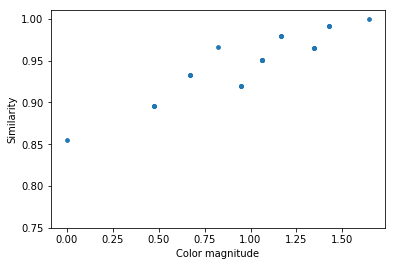

In [210]:
plt.figure(figsize=(6,4))
plt.scatter(result[:,0], result[:,1], s=14)
plt.xlabel('Color magnitude')
plt.ylabel('Similarity')
plt.ylim(0.75, 1.01)
plt.show()

In [ ]:
# Does color match score vary with shape?

Shape distance: 59.925
Similarity: 0.954


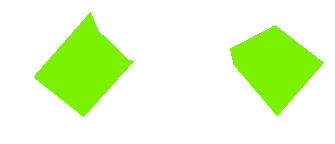




Shape distance: 41.995
Similarity: 0.969


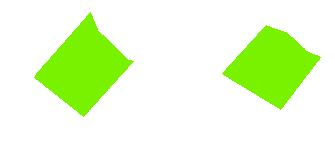




Shape distance: 73.559
Similarity: 0.968


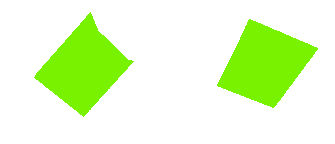




Shape distance: 74.992
Similarity: 0.950


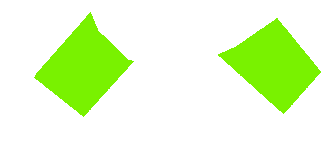




Shape distance: 0.000
Similarity: 1.000


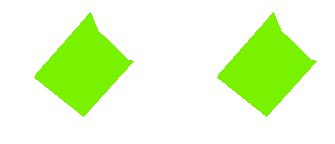




Shape distance: 82.923
Similarity: 0.945


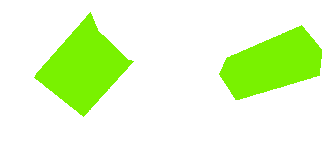




Shape distance: 52.840
Similarity: 0.969


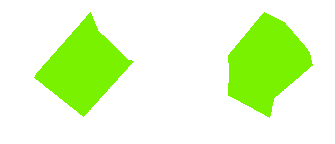




Shape distance: 70.397
Similarity: 0.947


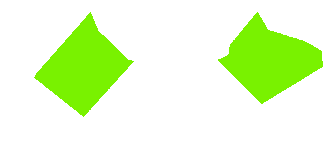




Shape distance: 50.826
Similarity: 0.968


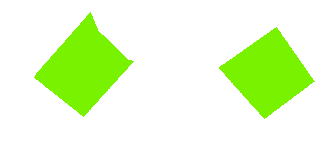




Shape distance: 74.907
Similarity: 0.952


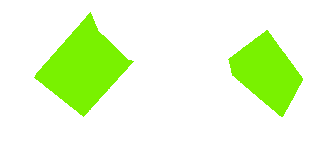

In [211]:
result2 = np.zeros(shape=(10,2))
for i in range(10):
    dist = modHausdorffDistance(shape_set[4], shape_set[i])
    print('Shape distance: %0.3f' % dist)
    img1 = generate_image_np(shape_set[4], color_set[14])
    img2 = generate_image_np(shape_set[i], color_set[14])
    sim = compare2(img1, img2, 'cosine')
    result2[i] = [dist, sim]
    print('\n\n')

In [212]:
print(sorted(result[:,1]))

[0.94539612531661987, 0.94738423824310303, 0.94999045133590698, 0.95187318325042725, 0.95414257049560547, 0.9681209921836853, 0.96833568811416626, 0.96915209293365479, 0.96948856115341187, 1.0]


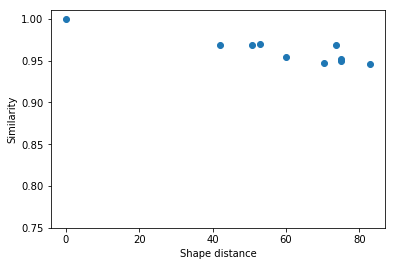

In [213]:
plt.figure(figsize=(6,4))
plt.scatter(result[:,0], result[:,1])
plt.xlabel('Shape distance')
plt.ylabel('Similarity')
plt.ylim(0.75, 1.01)
plt.show()

In [ ]:
# Does shape match score vary with color?

Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.  0.  0.]
Color distance: 1.062
Similarity: 0.873


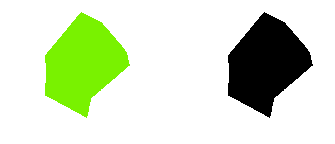




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.     0.     0.475]
Color distance: 1.164
Similarity: 0.847


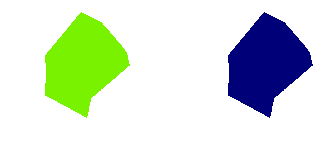




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.     0.475  0.   ]
Color distance: 0.672
Similarity: 0.953


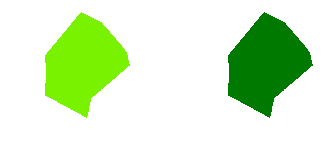




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.     0.   ]
Color distance: 0.950
Similarity: 0.900


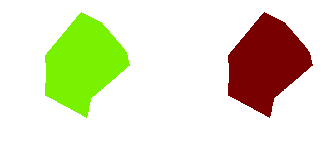




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.     0.475  0.475]
Color distance: 0.823
Similarity: 0.926


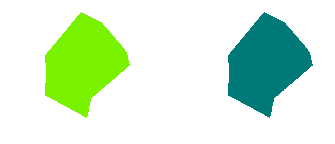




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.     0.475]
Color distance: 1.062
Similarity: 0.874


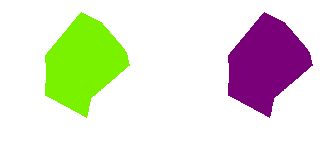




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.475  0.   ]
Color distance: 0.475
Similarity: 0.977


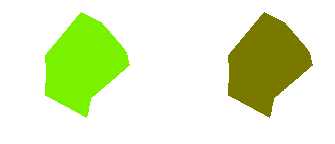




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.475  0.475]
Color distance: 0.672
Similarity: 0.951


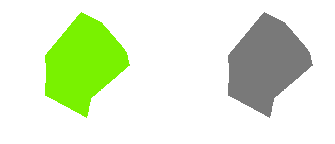




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.    0.    0.95]
Color distance: 1.425
Similarity: 0.780


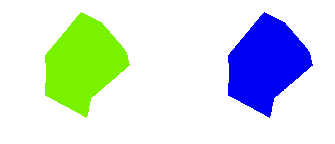




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.    0.95  0.  ]
Color distance: 0.475
Similarity: 0.976


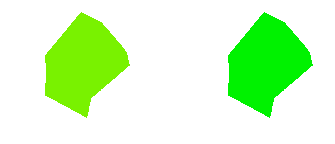




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95  0.    0.  ]
Color distance: 1.062
Similarity: 0.878


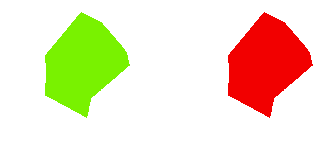




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.     0.475  0.95 ]
Color distance: 1.164
Similarity: 0.857


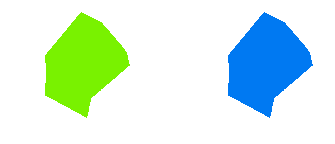




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.     0.95   0.475]
Color distance: 0.672
Similarity: 0.952


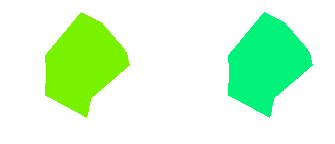




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.     0.95 ]
Color distance: 1.344
Similarity: 0.809


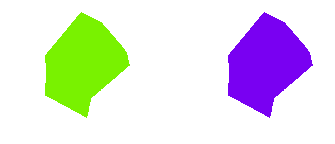




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.95   0.   ]
Color distance: 0.000
Similarity: 1.000


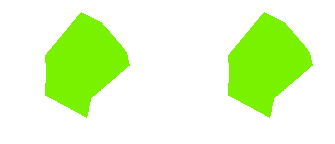




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95   0.     0.475]
Color distance: 1.164
Similarity: 0.857


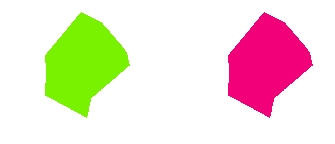




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95   0.475  0.   ]
Color distance: 0.672
Similarity: 0.952


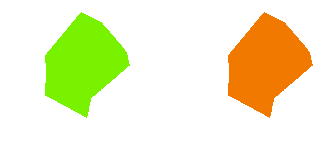




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.475  0.95 ]
Color distance: 1.062
Similarity: 0.884


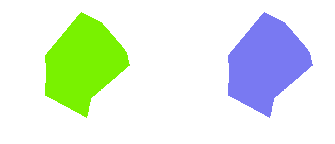




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.95   0.475]
Color distance: 0.475
Similarity: 0.977


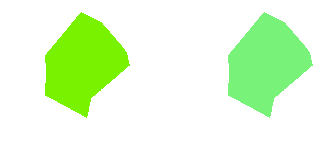




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95   0.475  0.475]
Color distance: 0.823
Similarity: 0.930


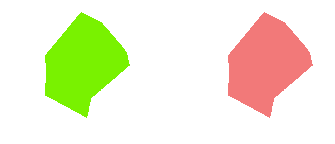




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.    0.95  0.95]
Color distance: 1.062
Similarity: 0.891


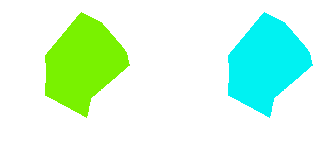




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95  0.    0.95]
Color distance: 1.425
Similarity: 0.802


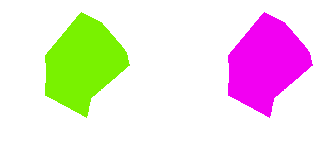




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95  0.95  0.  ]
Color distance: 0.475
Similarity: 0.980


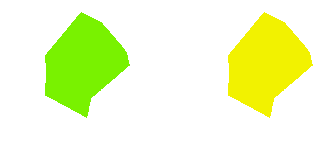




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.475  0.95   0.95 ]
Color distance: 0.950
Similarity: 0.916


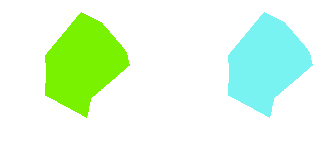




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95   0.475  0.95 ]
Color distance: 1.164
Similarity: 0.873


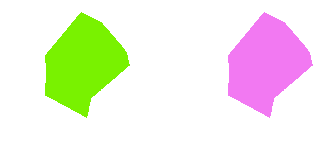




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95   0.95   0.475]
Color distance: 0.672
Similarity: 0.960


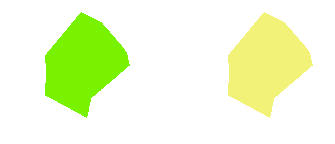




Color 1:  [ 0.475  0.95   0.   ]
Color 2:  [ 0.95  0.95  0.95]
Color distance: 1.062
Similarity: 0.907


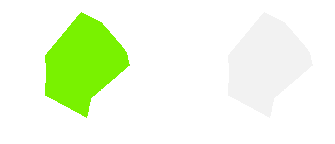

In [201]:
result3 = np.zeros(shape=(27,2))
for i in range(27):
    print('Color 1: ', color_set[14])
    print('Color 2: ', color_set[i])
    dist = np.linalg.norm(color_set[14] - color_set[i])
    print('Color distance: %0.3f' % dist)
    img1 = generate_image_np(shape_set[6], color_set[14])
    img2 = generate_image_np(shape_set[6], color_set[i])
    sim = compare2(img1, img2, 'cosine')
    result3[i] = [dist, sim]
    print('\n\n')

In [207]:
print(sorted(result[:,1]))

[0.78048920631408691, 0.80159461498260498, 0.80932796001434326, 0.84664016962051392, 0.85699570178985596, 0.85699570178985596, 0.87273120880126953, 0.87275481224060059, 0.87424910068511963, 0.878182053565979, 0.88384366035461426, 0.89076739549636841, 0.89962649345397949, 0.90719056129455566, 0.91643995046615601, 0.92574059963226318, 0.93041443824768066, 0.95113825798034668, 0.95233160257339478, 0.9523317813873291, 0.95261275768280029, 0.96012455224990845, 0.97587478160858154, 0.97698569297790527, 0.97723245620727539, 0.97994065284729004, 1.0]


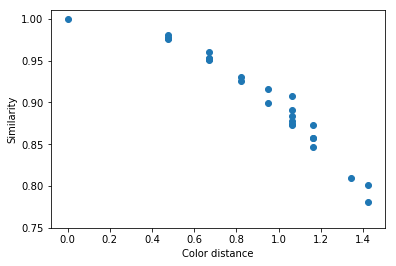

In [204]:
plt.figure(figsize=(6,4))
plt.scatter(result[:,0], result[:,1])
plt.xlabel('Color distance')
plt.ylabel('Similarity')
plt.ylim(0.75, 1.01)
plt.show()

In [ ]:
# Does shape match score vary with shape?

Similarity: 0.841


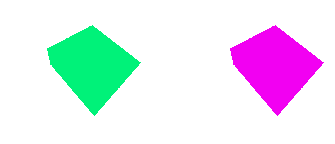




Similarity: 0.846


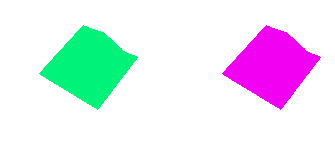




Similarity: 0.819


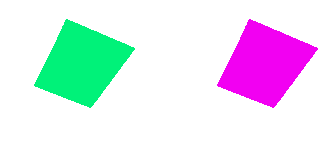




Similarity: 0.827


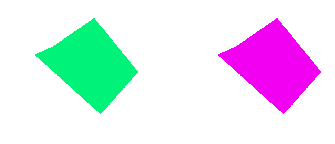




Similarity: 0.822


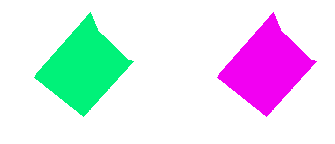




Similarity: 0.836


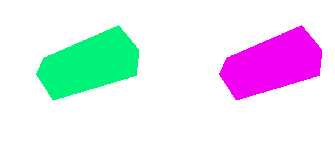




Similarity: 0.802


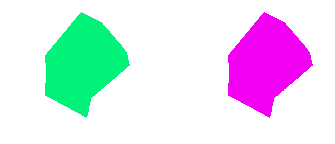




Similarity: 0.820


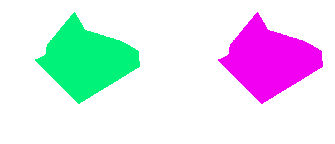




Similarity: 0.842


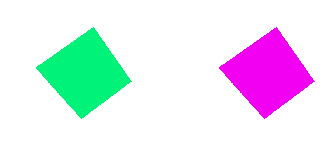




Similarity: 0.884


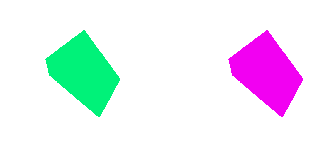

In [214]:
result4 = np.zeros(10)
for i in range(10):
    img1 = generate_image_np(shape_set[i], color_set[12])
    img2 = generate_image_np(shape_set[i], color_set[21])
    result4[i] = compare2(img1, img2, 'cosine')
    print('\n\n')

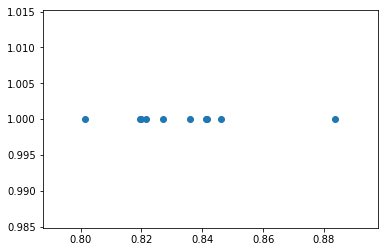

In [219]:
plt.figure()
plt.scatter(result4, np.ones_like(result4))
plt.show()

In [ ]:
# Now, let's look at the distribution of shape matches

In [234]:
nb_trials = 50
sims1 = np.zeros(nb_trials)
for i in range(nb_trials):
    shape = np.random.choice(shape_set, 1)[0]
    c1, c2 = np.random.choice(range(len(color_set)), 2, replace=False)
    img1 = generate_image_np(shape, color_set[c1])
    img2 = generate_image_np(shape, color_set[c2])
    #_ = compare2(img1, img2)
    sims1[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims1.mean())

Average similarity: 0.920


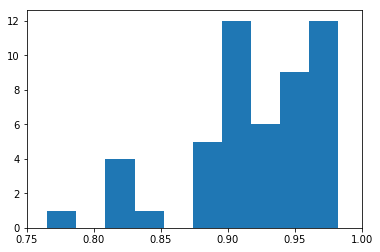

In [242]:
plt.figure(figsize=(6,4))
plt.hist(sims1, 10)
plt.xlim(0.75, 1.)
plt.show()

In [ ]:
# Now, let's look at the distribution of color matches

In [236]:
nb_trials = 50
sims2 = np.zeros(nb_trials)
for i in range(nb_trials):
    c = np.random.choice(range(len(color_set)), 1)[0]
    s1, s2 = np.random.choice(shape_set, 2, replace=False)
    img1 = generate_image_np(s1, color_set[c])
    img2 = generate_image_np(s2, color_set[c])
    #_ = compare2(img1, img2)
    sims2[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims2.mean())

Average similarity: 0.952


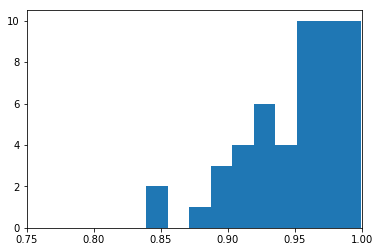

In [243]:
plt.figure(figsize=(6,4))
plt.hist(sims2, 10)
plt.xlim(0.75, 1.)
plt.show()

In [254]:
texture_set = sorted([file for file in os.listdir('../data/textures') if file.endswith('tiff')])

In [ ]:
# Now let's try shape again but w/ 2 identical textures

Similarity: 0.974


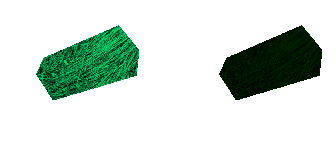

Similarity: 0.951


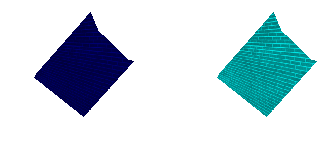

Similarity: 0.984


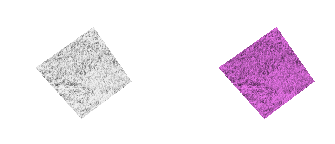

Similarity: 0.907


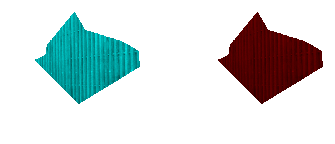

Similarity: 0.917


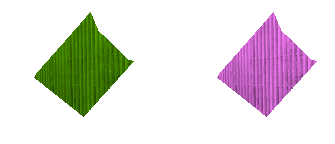

Similarity: 0.983


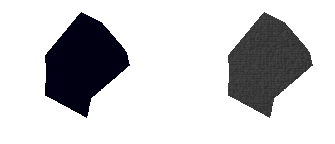

Similarity: 0.960


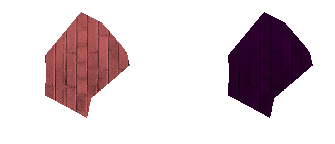

Similarity: 0.983


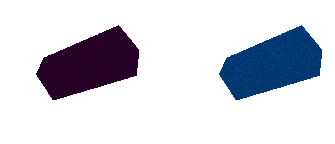

Similarity: 0.943


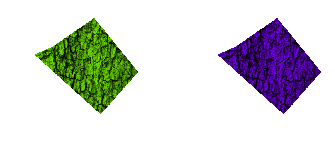

Similarity: 0.988


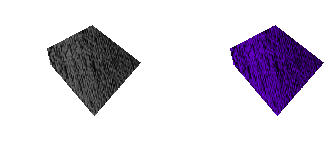

Similarity: 0.982


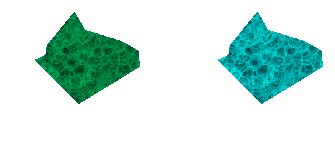

Similarity: 0.960


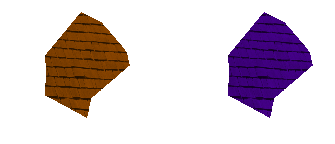

Similarity: 0.952


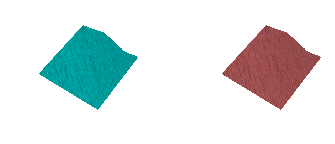

Similarity: 0.986


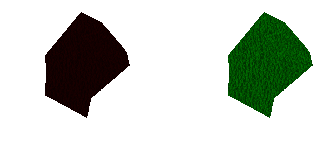

Similarity: 0.988


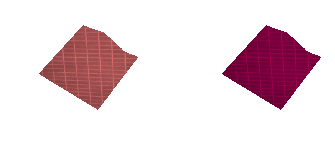

Similarity: 0.993


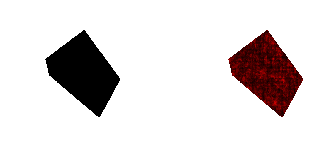

Similarity: 0.954


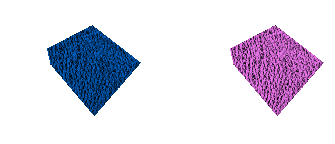

Similarity: 0.964


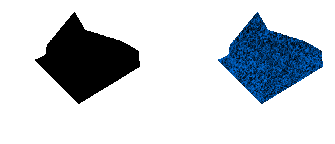

Similarity: 0.995


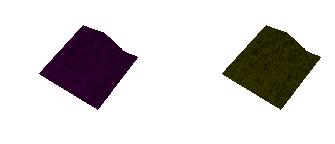

Similarity: 0.961


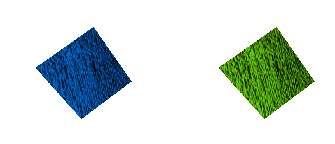

Similarity: 0.958


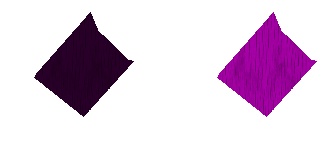

Similarity: 0.954


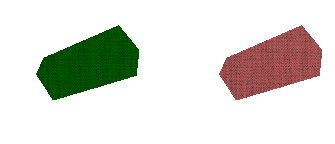

Similarity: 0.912


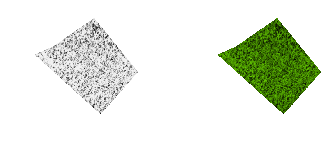

Similarity: 0.965


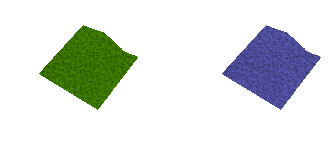

Similarity: 0.968


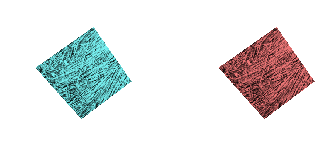

Similarity: 0.976


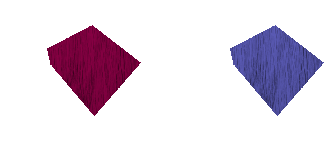

Similarity: 0.971


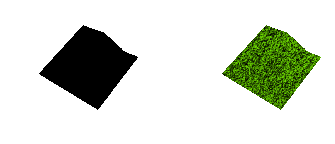

Similarity: 0.971


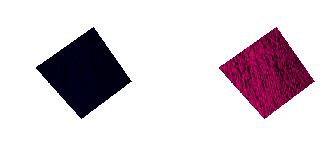

Similarity: 0.996


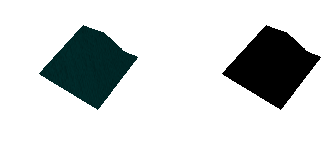

Similarity: 0.990


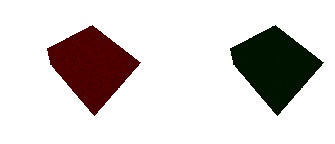

Similarity: 0.923


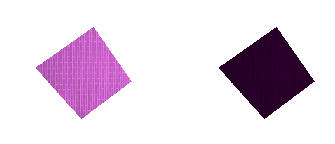

Similarity: 0.853


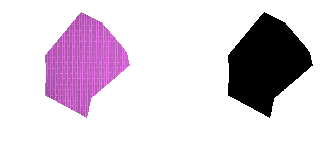

Similarity: 0.971


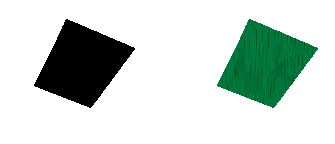

Similarity: 0.953


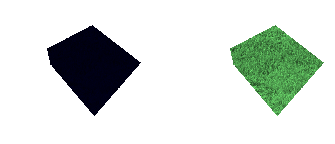

Similarity: 0.964


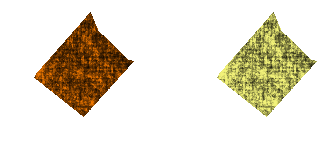

Similarity: 0.964


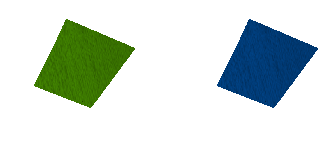

Similarity: 0.995


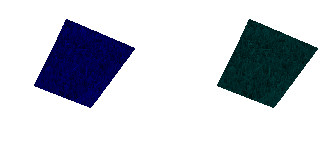

Similarity: 0.946


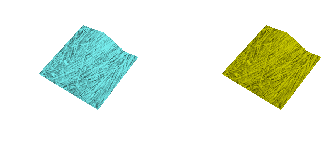

Similarity: 0.974


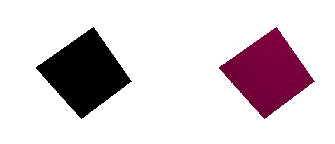

Similarity: 0.959


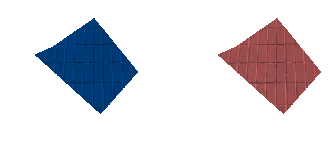

Similarity: 0.988


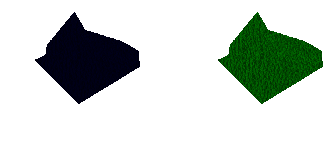

Similarity: 0.974


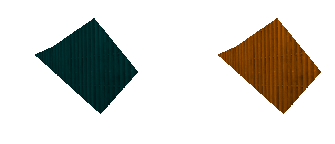

Similarity: 0.994


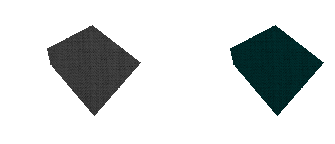

Similarity: 0.957


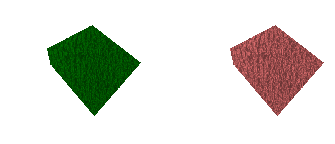

Similarity: 0.934


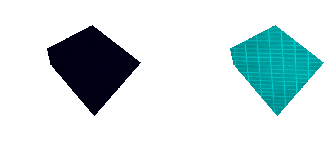

Similarity: 0.811


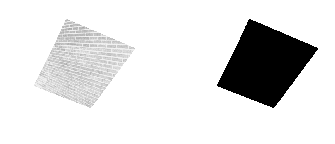

Similarity: 0.989


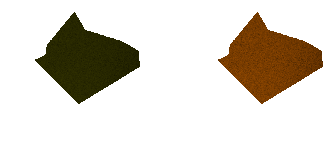

Similarity: 0.970


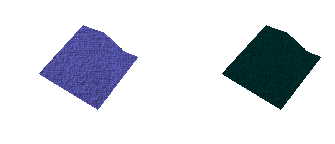

Similarity: 0.983


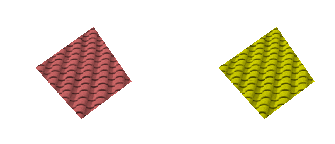

Similarity: 0.983


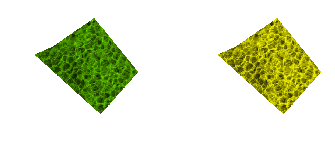

Average similarity: 0.961


In [255]:
nb_trials = 50
sims3 = np.zeros(nb_trials)
for i in range(nb_trials):
    texture = np.random.choice(texture_set, 1)[0]
    shape = np.random.choice(shape_set, 1)[0]
    c1, c2 = np.random.choice(range(len(color_set)), 2, replace=False)
    img1 = generate_image_np(shape, color_set[c1], texture)
    img2 = generate_image_np(shape, color_set[c2], texture)
    _ = compare2(img1, img2)
    sims3[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims3.mean())

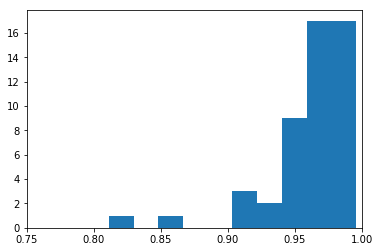

In [256]:
plt.figure(figsize=(6,4))
plt.hist(sims3, 10)
plt.xlim(0.75, 1.)
plt.show()

In [230]:
# Now let's try color again but w/ 2 identical textures

In [257]:
nb_trials = 50
sims4 = np.zeros(nb_trials)
for i in range(nb_trials):
    texture = np.random.choice(texture_set, 1)[0]
    c = np.random.choice(range(len(color_set)), 1)[0]
    s1, s2 = np.random.choice(shape_set, 2, replace=False)
    img1 = generate_image_np(s1, color_set[c], texture)
    img2 = generate_image_np(s2, color_set[c], texture)
    _ = compare2(img1, img2)
    sims4[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims4.mean())

Average similarity: 0.923


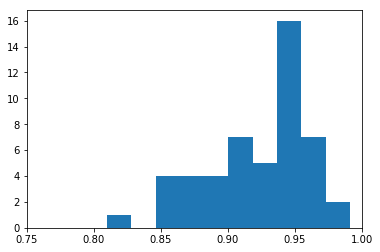

In [258]:
plt.figure(figsize=(6,4))
plt.hist(sims4, 10)
plt.xlim(0.75, 1.)
plt.show()

In [ ]:
# Now let's try shape again but w/ 2 different textures

Similarity: 0.980


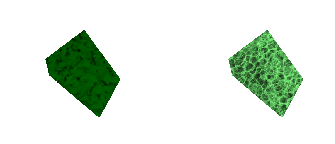

Similarity: 0.978


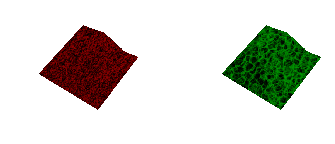

Similarity: 0.933


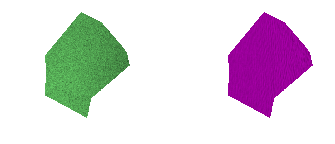

Similarity: 0.923


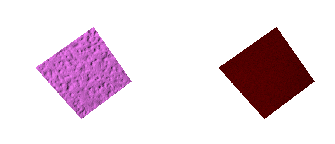

Similarity: 0.927


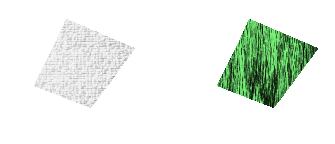

Similarity: 0.950


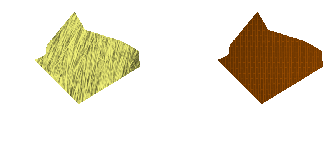

Similarity: 0.914


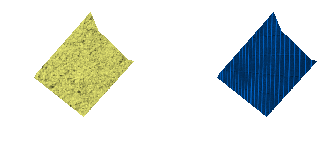

Similarity: 0.985


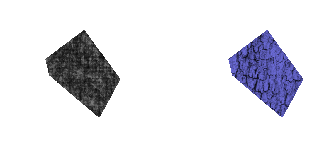

Similarity: 0.939


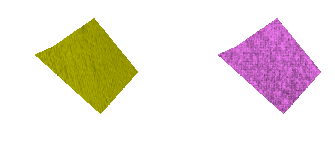

Similarity: 0.940


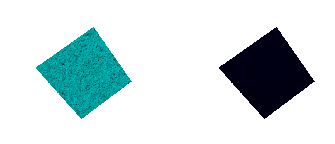

Similarity: 0.960


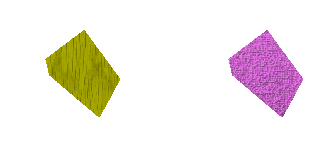

Similarity: 0.956


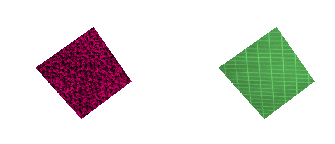

Similarity: 0.997


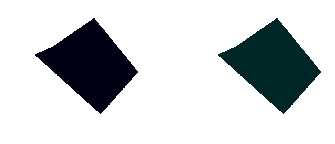

Similarity: 0.979


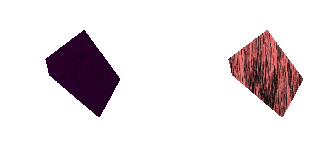

Similarity: 0.959


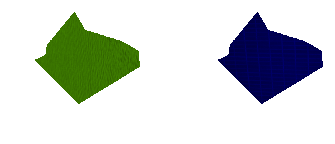

Similarity: 0.980


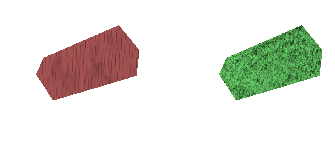

Similarity: 0.971


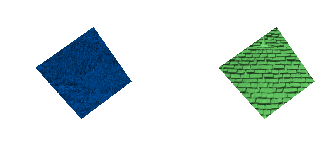

Similarity: 0.969


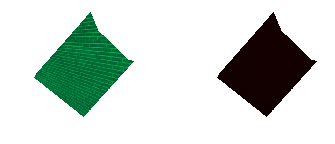

Similarity: 0.964


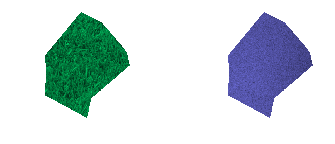

Similarity: 0.904


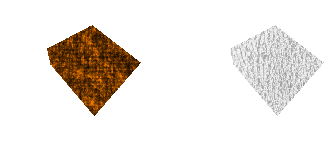

Similarity: 0.971


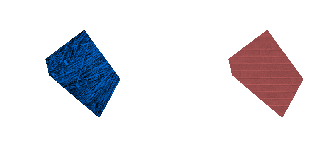

Similarity: 0.941


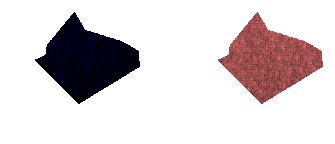

Similarity: 0.921


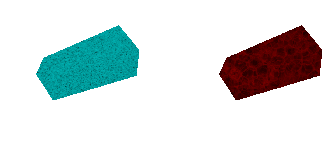

Similarity: 0.924


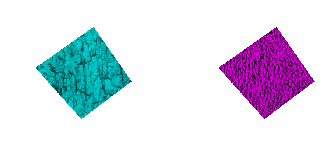

Similarity: 0.860


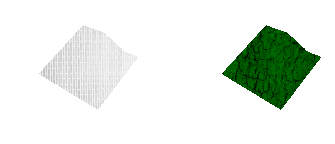

Similarity: 0.969


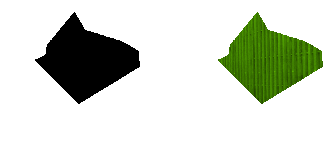

Similarity: 0.918


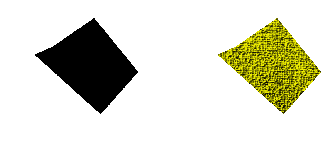

Similarity: 0.920


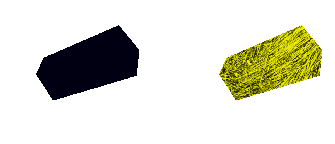

Similarity: 0.919


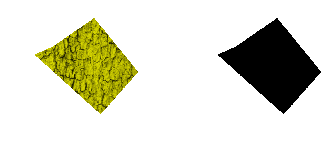

Similarity: 0.896


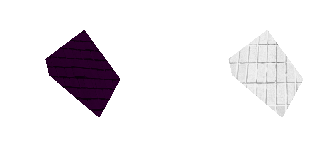

Similarity: 0.915


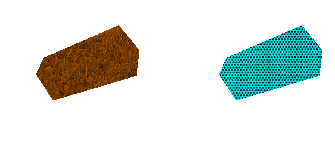

Similarity: 0.994


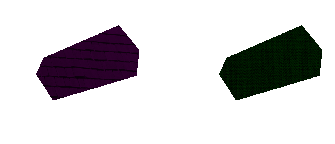

Similarity: 0.974


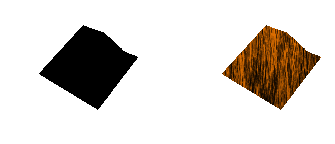

Similarity: 0.951


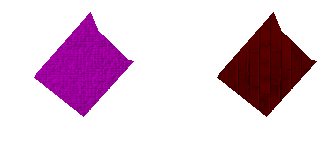

Similarity: 0.952


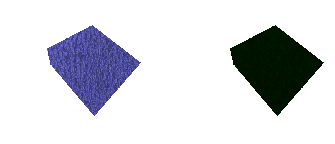

Similarity: 0.942


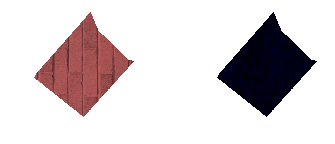

Similarity: 0.967


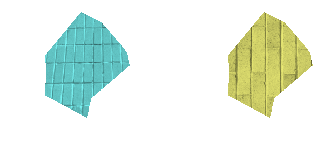

Similarity: 0.959


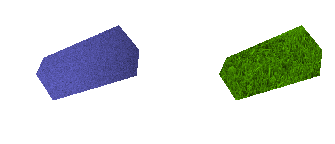

Similarity: 0.954


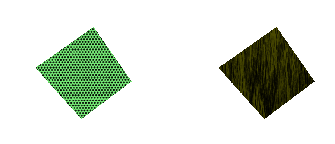

Similarity: 0.985


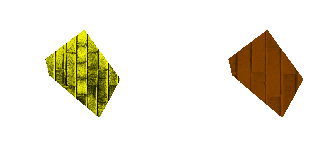

Similarity: 0.935


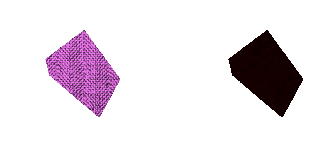

Similarity: 0.972


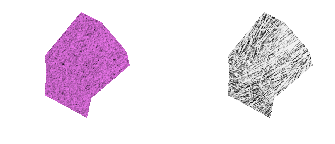

Similarity: 0.988


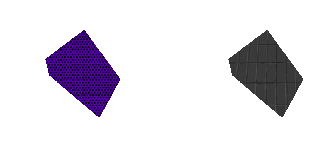

Similarity: 0.975


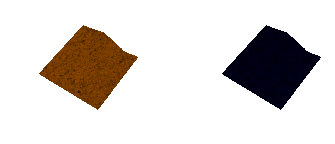

Similarity: 0.926


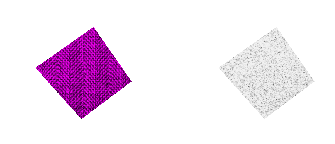

Similarity: 0.981


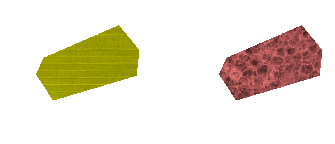

Similarity: 0.823


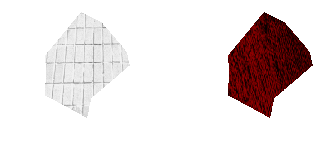

Similarity: 0.993


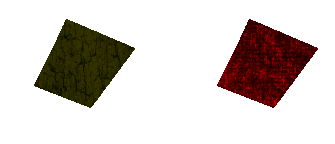

Similarity: 0.999


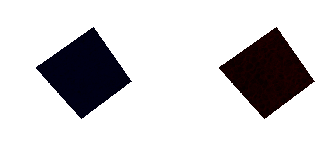

Similarity: 0.962


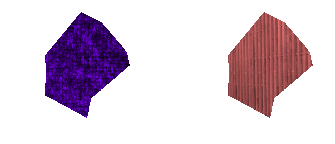

Average similarity: 0.950


In [259]:
nb_trials = 50
sims5 = np.zeros(nb_trials)
for i in range(nb_trials):
    texture1, texture2 = np.random.choice(texture_set, 2, replace=False)
    shape = np.random.choice(shape_set, 1)[0]
    c1, c2 = np.random.choice(range(len(color_set)), 2, replace=False)
    img1 = generate_image_np(shape, color_set[c1], texture1)
    img2 = generate_image_np(shape, color_set[c2], texture2)
    _ = compare2(img1, img2)
    sims5[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims5.mean())

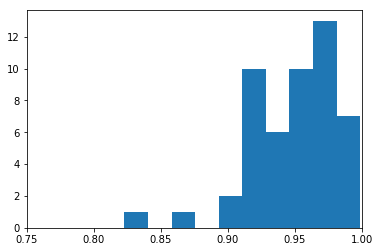

In [260]:
plt.figure(figsize=(6,4))
plt.hist(sims5, 10)
plt.xlim(0.75, 1.)
plt.show()

In [ ]:
# Now let's try color again but w/ 2 different textures

Similarity: 0.958


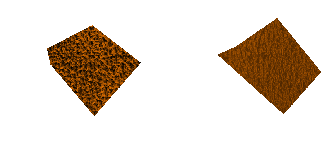

Similarity: 0.969


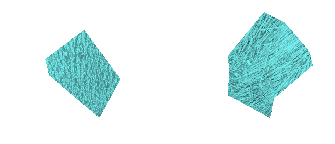

Similarity: 0.857


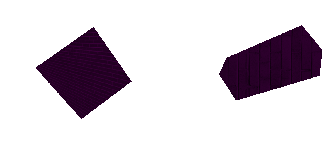

Similarity: 0.908


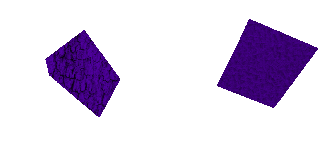

Similarity: 0.936


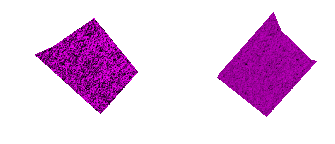

Similarity: 0.925


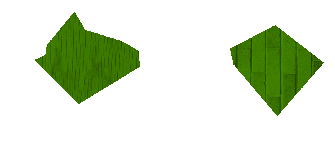

Similarity: 0.960


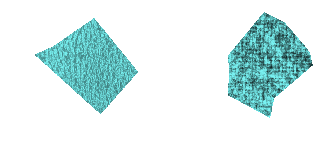

Similarity: 0.930


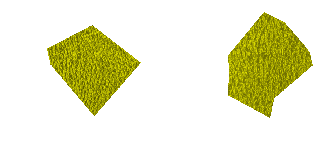

Similarity: 0.947


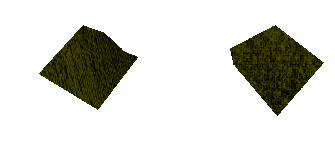

Similarity: 0.898


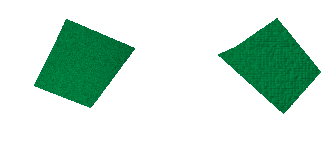

Similarity: 0.908


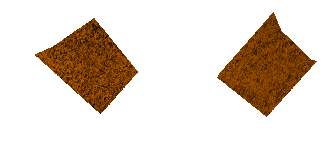

Similarity: 0.945


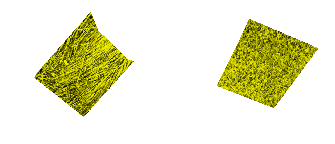

Similarity: 0.948


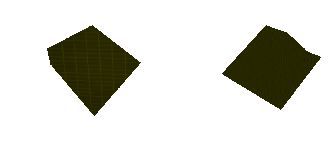

Similarity: 0.857


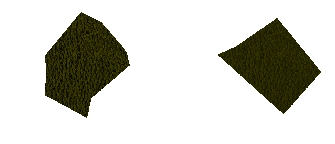

Similarity: 0.927


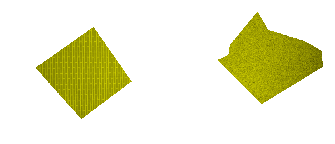

Similarity: 0.959


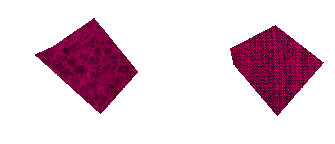

Similarity: 0.946


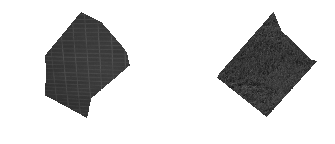

Similarity: 0.924


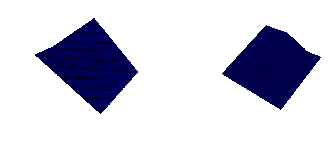

Similarity: 0.944


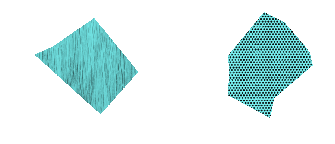

Similarity: 0.856


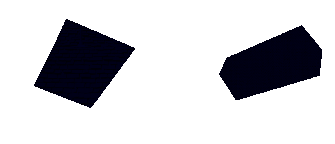

Similarity: 0.975


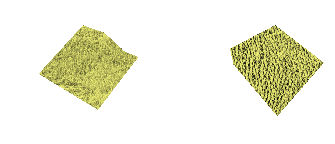

Similarity: 0.894


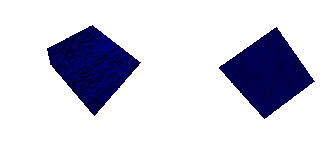

Similarity: 0.937


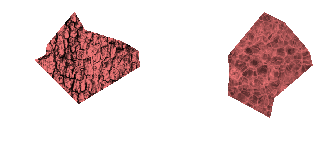

Similarity: 0.967


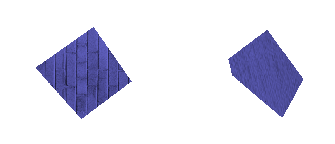

Similarity: 0.971


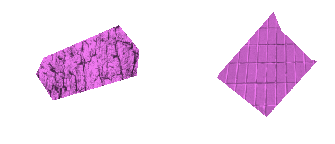

Similarity: 0.832


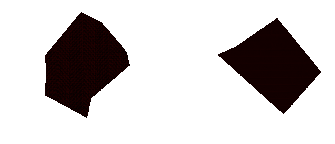

Similarity: 0.926


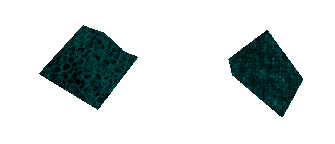

Similarity: 0.869


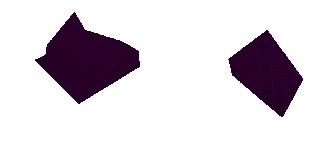

Similarity: 0.908


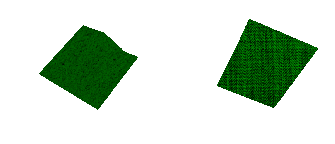

Similarity: 0.846


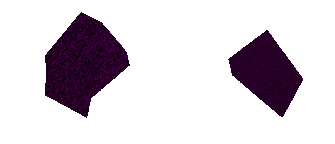

Similarity: 0.861


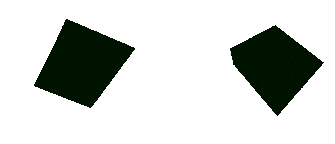

Similarity: 0.939


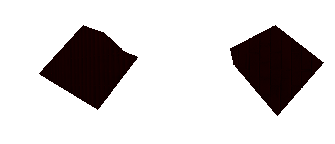

Similarity: 0.881


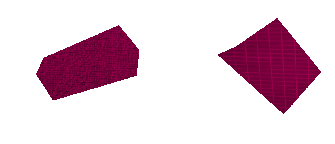

Similarity: 0.854


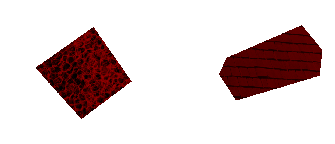

Similarity: 0.901


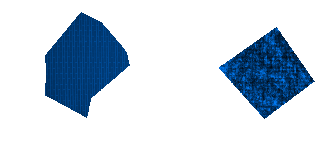

Similarity: 0.927


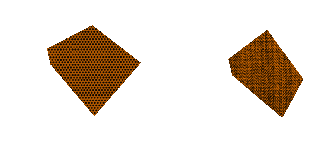

Similarity: 0.938


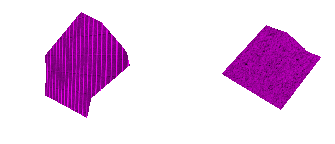

Similarity: 0.893


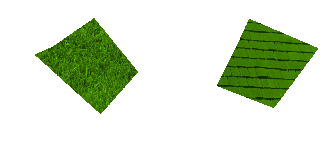

Similarity: 0.879


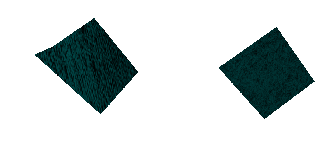

Similarity: 0.908


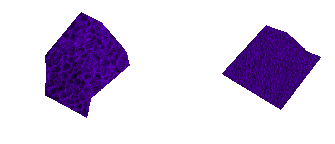

Similarity: 0.891


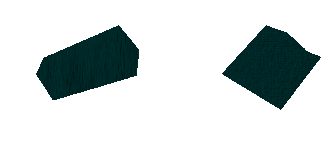

Similarity: 0.973


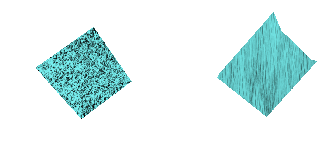

Similarity: 0.862


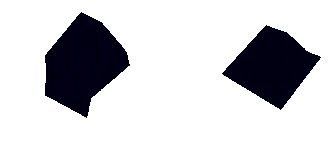

Similarity: 0.945


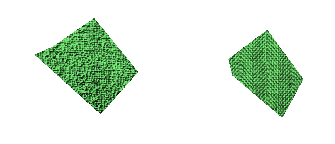

Similarity: 0.946


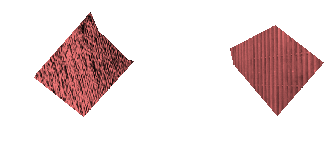

Similarity: 0.860


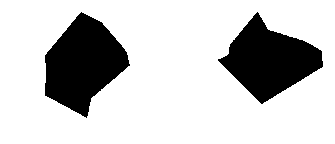

Similarity: 0.949


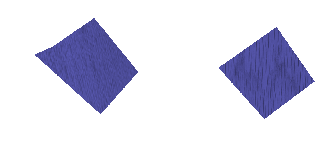

Similarity: 0.856


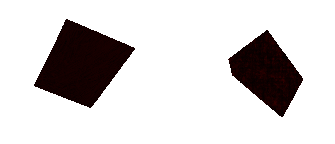

Similarity: 0.857


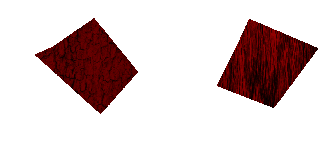

Similarity: 0.952


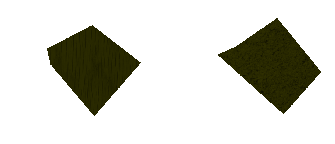

Average similarity: 0.914


In [261]:
nb_trials = 50
sims6 = np.zeros(nb_trials)
for i in range(nb_trials):
    texture1, texture2 = np.random.choice(texture_set, 2, replace=False)
    c = np.random.choice(range(len(color_set)), 1)[0]
    s1, s2 = np.random.choice(shape_set, 2, replace=False)
    img1 = generate_image_np(s1, color_set[c], texture1)
    img2 = generate_image_np(s2, color_set[c], texture2)
    _ = compare2(img1, img2)
    sims6[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims6.mean())

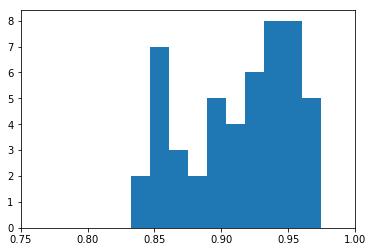

In [262]:
plt.figure(figsize=(6,4))
plt.hist(sims6, 10)
plt.xlim(0.75, 1.)
plt.show()

In [ ]:
# put all results together

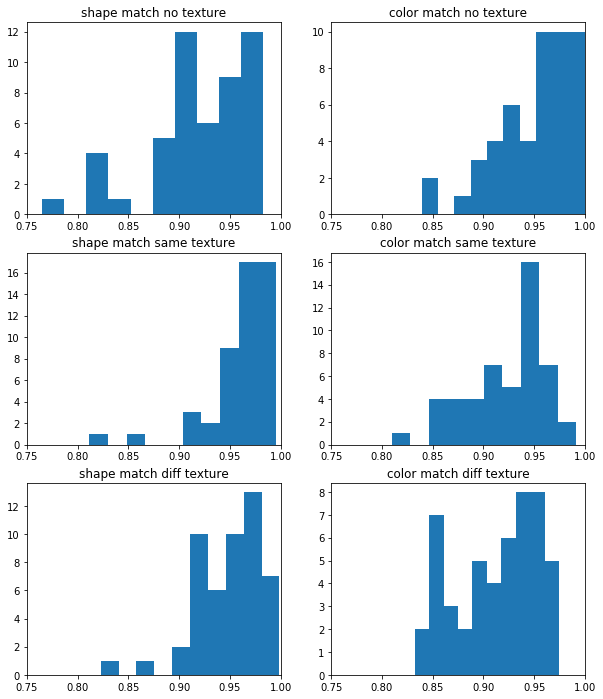

In [268]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 12))
axes[0,0].hist(sims1, 10)
axes[0,0].set_xlim(0.75, 1.)
axes[0,0].set_title('shape match no texture')

axes[0,1].hist(sims2, 10)
axes[0,1].set_xlim(0.75, 1.)
axes[0,1].set_title('color match no texture')

axes[1,0].hist(sims3, 10)
axes[1,0].set_xlim(0.75, 1.)
axes[1,0].set_title('shape match same texture')

axes[1,1].hist(sims4, 10)
axes[1,1].set_xlim(0.75, 1.)
axes[1,1].set_title('color match same texture')

axes[2,0].hist(sims5, 10)
axes[2,0].set_xlim(0.75, 1.)
axes[2,0].set_title('shape match diff texture')

axes[2,1].hist(sims6, 10)
axes[2,1].set_xlim(0.75, 1.)
axes[2,1].set_title('color match diff texture')

plt.show()

# Experiments...

In [304]:
img = image.load_img('../data/textures/%s' % texture_set[1], target_size=(200, 200))
img = image.img_to_array(img) / 255.

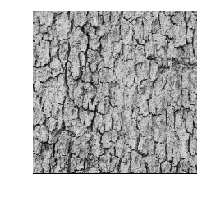

In [305]:
plt.figure(figsize=(3,3))
plt.imshow(img)
plt.axis('off')
plt.show()

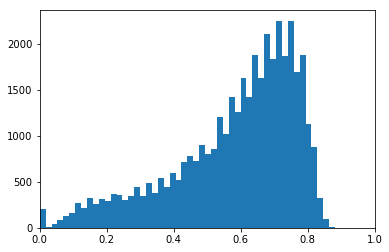

In [306]:
plt.figure()
plt.hist(img[:,:,0].flatten(), bins=50)
plt.xlim(0,1)
plt.show()

In [307]:
def adjust_contrast(img, factor):
    assert factor >= 1.
    img_p = 1. - img
    img_p /= factor
    img_p = 1. - img_p
    
    return img_p

In [308]:
img_p = adjust_contrast(img, 3)

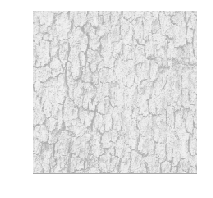

In [310]:
plt.figure(figsize=(3,3))
plt.imshow(img_p)
plt.axis('off')
plt.show()

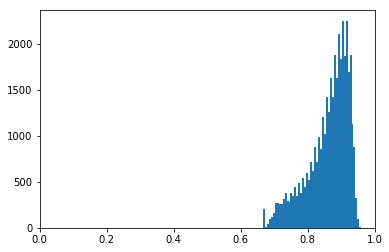

In [309]:
plt.figure()
plt.hist(img_p[:,:,0].flatten(), bins=50)
plt.xlim(0,1)
plt.show()

# Retry experiments from above but with contrast

In [311]:
def generate_image_np1(shape, color, texture, contrast_factor=1.):
    """

    :param shape:
    :param color:
    :param texture:
    :return:
    """
    save_file = '../data/temp.png'
    # Generate the base image and save it to a file
    img = image.load_img('../data/textures/%s' % texture, target_size=(500, 500))
    img = image.img_to_array(img) / 255.
    img = adjust_contrast(img, contrast_factor)
    fig = plt.figure(frameon=False)
    fig.set_size_inches(5, 5)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img*color, interpolation='bicubic')
    plt.savefig(save_file)
    plt.close()
    # Load the base image from file, crop it using mplpath,
    # and save back to the file
    img = image.load_img(save_file, target_size=(500, 500))
    os.remove(save_file)
    img = image.img_to_array(img)
    img /= 255.
    p = mplpath.Path(shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if not p.contains_point((i, j)):
                img[j,i,:] = np.array([1.,1.,1.])
                
    return img

Similarity: 0.910


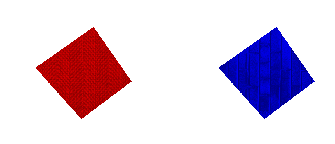

Similarity: 0.907


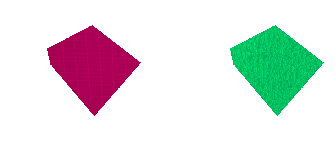

Similarity: 0.903


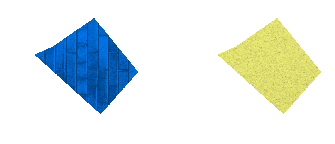

Similarity: 0.937


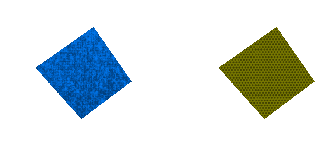

Similarity: 0.973


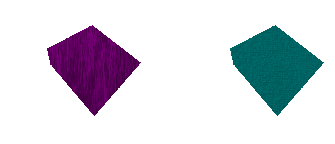

Similarity: 0.984


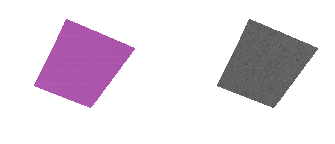

Similarity: 0.955


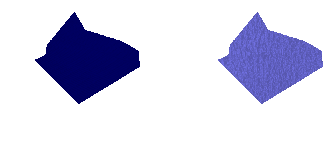

Similarity: 0.952


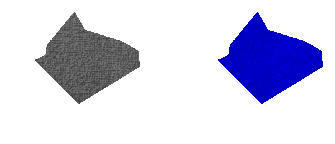

Similarity: 0.966


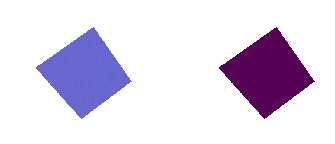

Similarity: 0.989


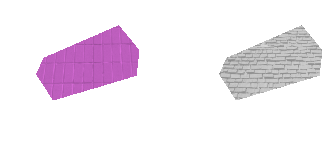

Similarity: 0.968


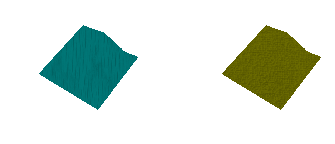

Similarity: 0.922


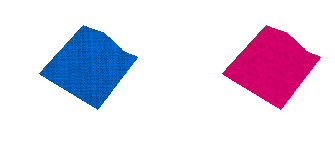

Similarity: 0.856


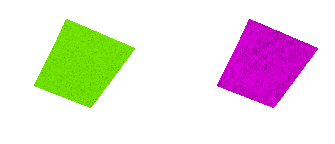

Similarity: 0.860


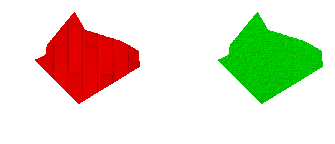

Similarity: 0.931


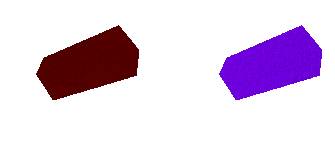

Similarity: 0.913


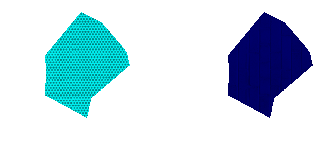

Similarity: 0.973


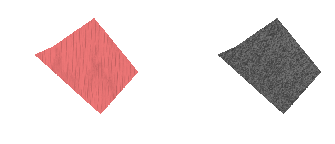

Similarity: 0.933


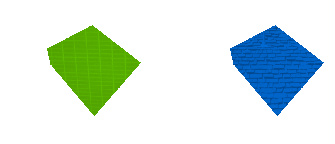

Similarity: 0.976


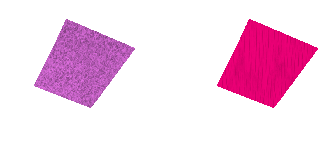

Similarity: 0.927


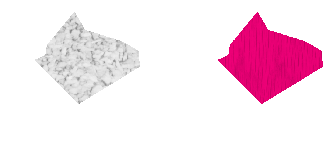

Similarity: 0.955


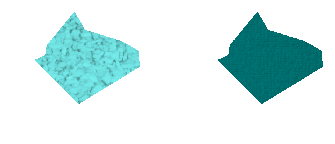

Similarity: 0.978


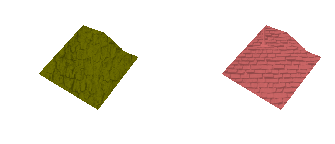

Similarity: 0.863


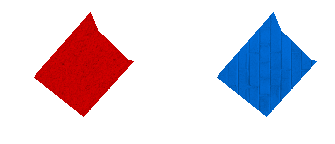

Similarity: 0.987


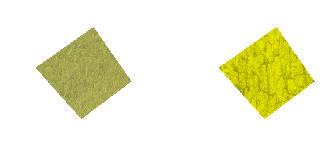

Similarity: 0.929


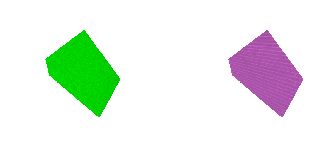

Similarity: 0.982


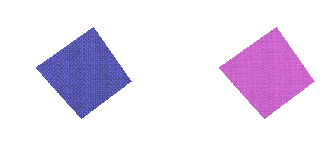

Similarity: 0.867


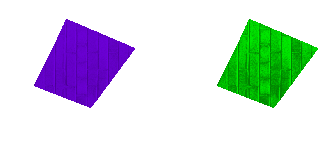

Similarity: 0.972


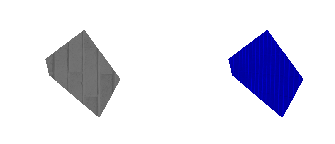

Similarity: 0.952


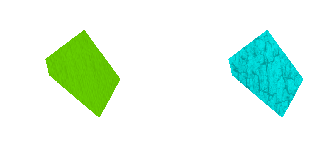

Similarity: 0.970


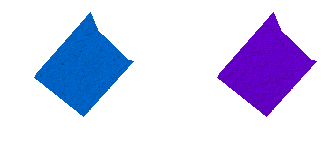

Similarity: 0.987


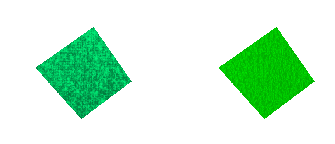

Similarity: 0.958


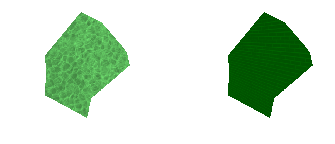

Similarity: 0.965


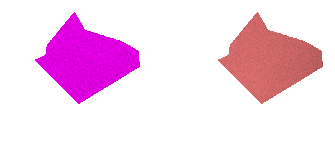

Similarity: 0.973


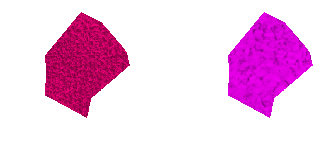

Similarity: 0.980


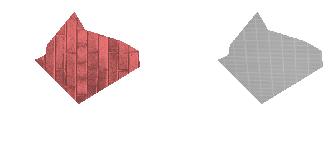

Similarity: 0.924


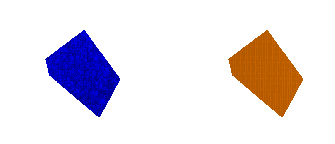

Similarity: 0.984


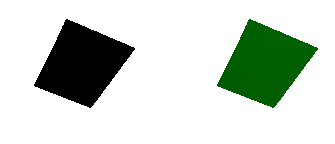

Similarity: 0.979


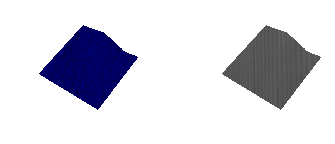

Similarity: 0.910


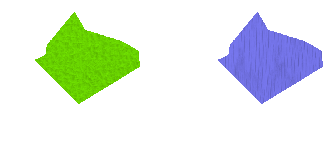

Similarity: 0.976


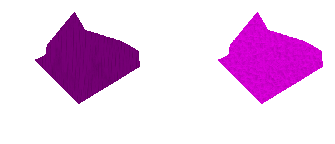

Similarity: 0.985


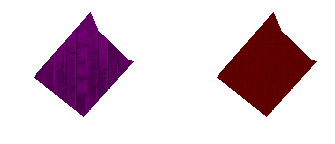

Similarity: 0.965


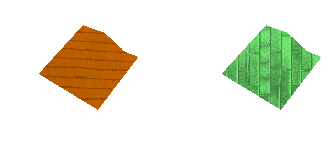

Similarity: 0.940


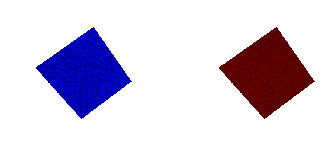

Similarity: 0.946


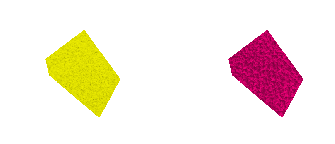

Similarity: 0.924


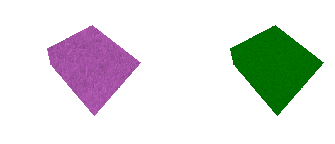

Similarity: 0.962


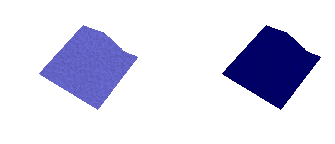

Similarity: 0.972


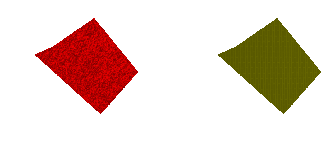

Similarity: 0.918


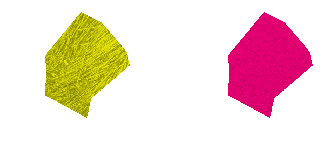

Similarity: 0.987


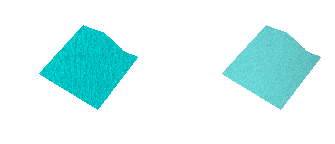

Similarity: 0.927


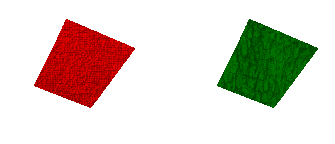

Average similarity: 0.947


In [314]:
nb_trials = 50
sims7 = np.zeros(nb_trials)
for i in range(nb_trials):
    texture1, texture2 = np.random.choice(texture_set, 2, replace=False)
    shape = np.random.choice(shape_set, 1)[0]
    c1, c2 = np.random.choice(range(len(color_set)), 2, replace=False)
    img1 = generate_image_np1(shape, color_set[c1], texture1, contrast_factor=2.)
    img2 = generate_image_np1(shape, color_set[c2], texture2, contrast_factor=2.)
    _ = compare2(img1, img2)
    sims7[i] = similarity(img1.flatten(), img2.flatten())
print('Average similarity: %0.3f' % sims7.mean())